In [9]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\3622710948.py:17: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm25_m   = pm25.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\3622710948.py:18: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm10_m   = pm10.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\3622710948.py:19: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  asthma_m = asthma.loc[idx].resample('M').sum().reset_index()
16:42:16 - cmdstanpy - INFO - Chain [1] start processing
16:42:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = 

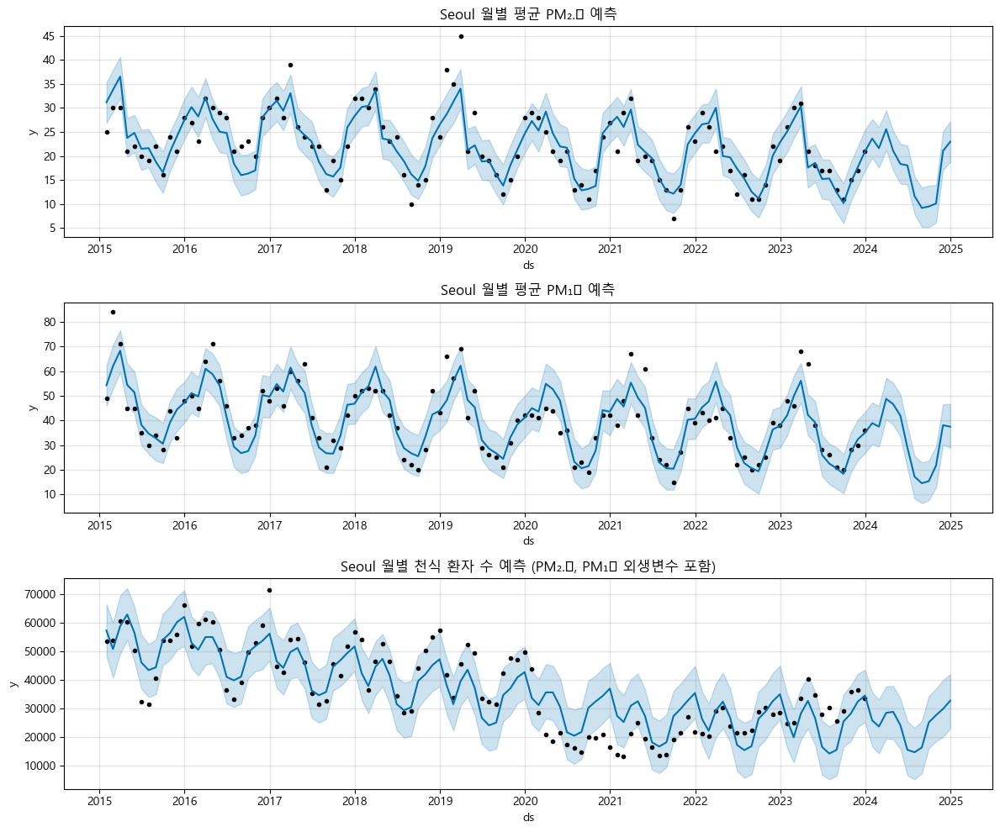

In [10]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# 이번엔 예측 결과가 가장 좋았던 프로펫 모델

# 1. 데이터 불러오기 & 월별 집계
asthma = pd.read_excel('Asthma_top30_Sum_removed_outliers.xlsx',
                       index_col=0, parse_dates=True)
pm25   = pd.read_excel('pm25_top30_fixed.xlsx',
                       index_col=0, parse_dates=True)
pm10   = pd.read_excel('pm10_top30_fixed.xlsx',
                       index_col=0, parse_dates=True)

# 2. 날짜 동기화 및 월별 집계
idx      = pm25.index.intersection(asthma.index).intersection(pm10.index)
pm25_m   = pm25.loc[idx].resample('M').mean().reset_index()
pm10_m   = pm10.loc[idx].resample('M').mean().reset_index()
asthma_m = asthma.loc[idx].resample('M').sum().reset_index()

# 3. Prophet 포맷으로 변환(ds, y 컬럼)
def make_df(df, city):
    tmp = df.iloc[:, [0, df.columns.get_loc(city)]].copy()
    tmp.columns = ['ds','y']
    return tmp

city    = 'Seoul'      # 분석할 도시명
df25    = make_df(pm25_m,   city)
df10    = make_df(pm10_m,   city)
df_asth = make_df(asthma_m, city)

# 4. PM2.5 모델 학습 + 12개월 예측
m25   = Prophet(yearly_seasonality=True)
m25.fit(df25)
fut25 = m25.make_future_dataframe(periods=12, freq='M')
fc25  = m25.predict(fut25)

# 5. PM10 모델 학습 + 12개월 예측
m10   = Prophet(yearly_seasonality=True)
m10.fit(df10)
fut10 = m10.make_future_dataframe(periods=12, freq='M')
fc10  = m10.predict(fut10)

# 6. 천식 모델에 PM2.5·PM10 외생변수 추가
df_asth = (
    df_asth
    .merge(fc25[['ds','yhat']].rename(columns={'yhat':'pm25'}), on='ds')
    .merge(fc10[['ds','yhat']].rename(columns={'yhat':'pm10'}), on='ds')
)

m_as = Prophet(yearly_seasonality=True)
m_as.add_regressor('pm25')
m_as.add_regressor('pm10')
m_as.fit(df_asth.dropna(subset=['pm25','pm10']))

fut_as = pd.DataFrame({
    'ds'  : fc25['ds'],
    'pm25': fc25['yhat'],
    'pm10': fc10['yhat'],
    'y'   : None
})
fc_as = m_as.predict(fut_as)

# 7. 3행 1열 Subplot 으로 그리기
fig, axes = plt.subplots(3, 1, figsize=(12, 10))

# (1) PM2.5
m25.plot(fc25, ax=axes[0])
axes[0].set_title(f'{city} 월별 평균 PM₂.₅ 예측')

# (2) PM10
m10.plot(fc10, ax=axes[1])
axes[1].set_title(f'{city} 월별 평균 PM₁₀ 예측')

# (3) 천식환자수
m_as.plot(fc_as, ax=axes[2])
axes[2].set_title(f'{city} 월별 천식 환자 수 예측 (PM₂.₅, PM₁₀ 외생변수 포함)')

# 8. 레이아웃 조정
fig.subplots_adjust(hspace=0.3)
plt.tight_layout()
plt.show()


16:42:17 - cmdstanpy - INFO - Chain [1] start processing
16:42:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:17 - cmdstanpy - INFO - Chain [1] start processing
16:42:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\2848457453.py:45: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


            ds  yhat_no_exog  yhat_with_exog
108 2024-01-31  24975.417591    25832.555316
109 2024-02-29  21750.560531    23685.608186
110 2024-03-31  27499.780320    28484.560695
111 2024-04-30  29786.262166    28851.351416
112 2024-05-31  24845.476562    24157.319528
113 2024-06-30  16043.674291    15516.111701
114 2024-07-31  14090.706890    14678.756446
115 2024-08-31  15564.148305    16324.663661
116 2024-09-30  24831.256591    25150.248707
117 2024-10-31  27119.798068    27663.126168
118 2024-11-30  30756.086827    29860.641166
119 2024-12-31  33189.680148    32752.399597


C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\2848457453.py:45: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


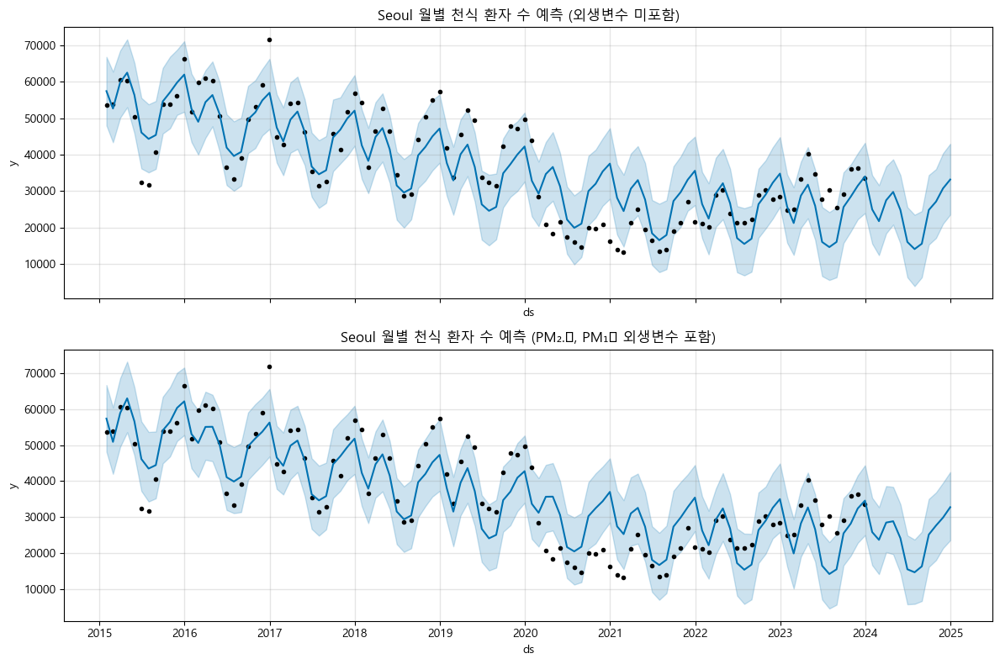

In [11]:
# ——————————————————————————————————————————
# (추가) 외생변수 미포함 vs 포함 모델 비교

# 1) 외생변수 미포함 모델 학습/예측
m_as_no_exog = Prophet(yearly_seasonality=True)
# df_asth는 기존에 ds,y 컬럼으로 준비된 DataFrame
m_as_no_exog.fit(df_asth)
fut_no = m_as_no_exog.make_future_dataframe(periods=12, freq='M')
fc_no  = m_as_no_exog.predict(fut_no)

# 2) 외생변수 포함 모델 학습/예측
m_as_exog = Prophet(yearly_seasonality=True)
m_as_exog.add_regressor('pm25')
m_as_exog.add_regressor('pm10')
# df_asth_exog 는 기존에 df_asth에 pm25,pm10 예측치를 병합한 DataFrame
m_as_exog.fit(df_asth.dropna(subset=['pm25','pm10']))
fut_ex = pd.DataFrame({
    'ds'  : fc25['ds'],
    'pm25': fc25['yhat'],
    'pm10': fc10['yhat']
})
# Prophet은 y 컬럼 없이도 외생변수 포맷을 맞춰 predict 가능
fc_ex = m_as_exog.predict(fut_ex)

# 3) 결과 비교용 DataFrame 생성
compare_df = pd.DataFrame({
    'ds'              : fc_no['ds'],
    'yhat_no_exog'    : fc_no['yhat'],
    'yhat_with_exog'  : fc_ex['yhat']
})
print(compare_df.tail(12))    # 마지막 12개월 예측 결과만 출력

# 4) 시각화: 외생변수 미포함 vs 포함
fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# (a) 외생변수 미포함
m_as_no_exog.plot(fc_no, ax=axes[0])
axes[0].set_title(f'{city} 월별 천식 환자 수 예측 (외생변수 미포함)')

# (b) 외생변수 포함
m_as_exog.plot(fc_ex, ax=axes[1])
axes[1].set_title(f'{city} 월별 천식 환자 수 예측 (PM₂.₅, PM₁₀ 외생변수 포함)')

fig.subplots_adjust(hspace=0.3)
plt.tight_layout()
plt.show()
# ——————————————————————————————————————————


In [12]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd

# ——————————————————————————————————————————
# 1) 마지막 12개월 실제 관측치 뽑기
#    df_asth: Prophet 포맷(ds, y) 전체 데이터
actual_s = df_asth.set_index('ds')['y'].iloc[-12:]    # (12,)

# 2) 두 모델의 예측 결과를 시리즈로 변환
fc_no_s = fc_no.set_index('ds')['yhat']               # 외생변수 미포함
fc_ex_s = fc_ex.set_index('ds')['yhat']               # 외생변수 포함

# 3) 동일한 ds(월말) 인덱스만 골라내기
common_idx = actual_s.index
pred_no    = fc_no_s.loc[common_idx].values           # (12,)
pred_ex    = fc_ex_s.loc[common_idx].values           # (12,)
actual     = actual_s.values                          # (12,)

# 4) 평가 함수
def evaluate_models(actual, pred, label):
    mse  = mean_squared_error(actual, pred)
    rmse = np.sqrt(mse)
    r2   = r2_score(actual, pred)
    print(f"[{label}] MSE={mse:.3f}, RMSE={rmse:.3f}, R2={r2:.3f}")

# 5) 두 모델 성능 출력
print("=== 천식 환자 수 예측 모델 비교 (마지막 12개월) ===\n")
evaluate_models(actual, pred_no, '외생변수 미포함 모델')
evaluate_models(actual, pred_ex, '외생변수 포함 모델')

# 6) 결과 DataFrame 으로 보기 (선택)
comp = pd.DataFrame({
    'actual'          : actual,
    'pred_no_exog'    : pred_no,
    'pred_with_exog'  : pred_ex
}, index=common_idx)
print("\n— 예측 vs 실제 (마지막 12개월) —")
display(comp.round(1))
# ——————————————————————————————————————————


=== 천식 환자 수 예측 모델 비교 (마지막 12개월) ===

[외생변수 미포함 모델] MSE=63068992.934, RMSE=7941.599, R2=-1.689
[외생변수 포함 모델] MSE=63375170.991, RMSE=7960.852, R2=-1.703

— 예측 vs 실제 (마지막 12개월) —


,actual,pred_no_exog,pred_with_exog
ds,,,
2023-01-31,24841,25703.1,26065.7
2023-02-28,25081,21237.9,19906.0
2023-03-31,33435,28771.4,28261.9
2023-04-30,40301,31777.1,32678.3
2023-05-31,34786,25987.5,26630.4
2023-06-30,27872,16038.3,16504.0
2023-07-31,30306,14633.9,14200.5
2023-08-31,25590,16047.0,15504.7
2023-09-30,29118,25634.1,25490.1


C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\939747634.py:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm25_m   = pm25.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\939747634.py:22: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm10_m   = pm10.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\939747634.py:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  asthma_m = asthma.loc[idx].resample('M').sum().reset_index()
16:42:18 - cmdstanpy - INFO - Chain [1] start processing
16:42:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.

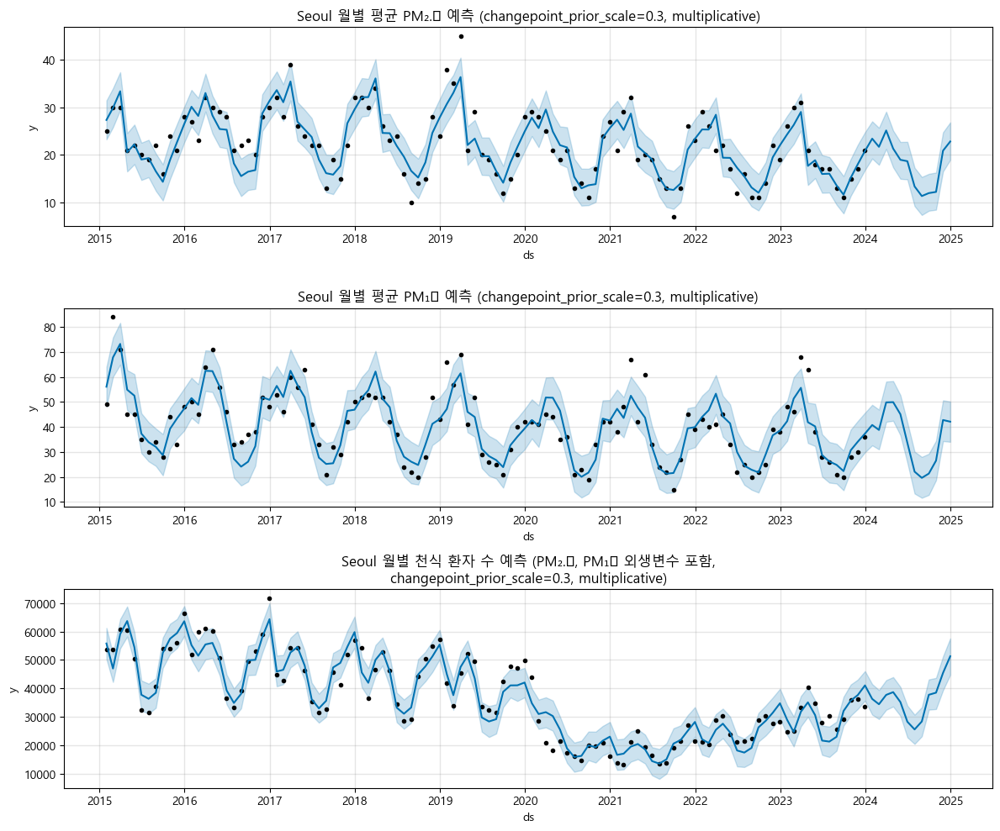

In [13]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# 1. 데이터 불러오기 & 월별 집계
asthma = pd.read_excel(
    'Asthma_top30_Sum_removed_outliers.xlsx',
    index_col=0, parse_dates=True
)
pm25 = pd.read_excel(
    'pm25_top30_fixed.xlsx',
    index_col=0, parse_dates=True
)
pm10 = pd.read_excel(
    'pm10_top30_fixed.xlsx',
    index_col=0, parse_dates=True
)

# 2. 날짜 동기화 및 월별 집계
idx      = pm25.index.intersection(asthma.index).intersection(pm10.index)
pm25_m   = pm25.loc[idx].resample('M').mean().reset_index()
pm10_m   = pm10.loc[idx].resample('M').mean().reset_index()
asthma_m = asthma.loc[idx].resample('M').sum().reset_index()

# 3. Prophet 입력 포맷 변환 (ds, y)
def make_df(df_month, city):
    tmp = df_month.iloc[:, [0, df_month.columns.get_loc(city)]].copy()
    tmp.columns = ['ds','y']
    return tmp

city    = 'Seoul'  # 분석할 도시명 설정
df25    = make_df(pm25_m,   city)
df10    = make_df(pm10_m,   city)
df_asth = make_df(asthma_m, city)

# 4. PM2.5 모델 학습 + 12개월 예측 (옵션 튜닝 포함)
m25 = Prophet(
    yearly_seasonality=True,
    changepoint_prior_scale=0.3,
    seasonality_mode='multiplicative'
)
m25.fit(df25)
fut25 = m25.make_future_dataframe(periods=12, freq='M')
fc25  = m25.predict(fut25)

# 5. PM10 모델 학습 + 12개월 예측 (옵션 튜닝 포함)
m10 = Prophet(
    yearly_seasonality=True,
    changepoint_prior_scale=0.3,
    seasonality_mode='multiplicative'
)
m10.fit(df10)
fut10 = m10.make_future_dataframe(periods=12, freq='M')
fc10  = m10.predict(fut10)

# 6. 천식 환자 수 모델에 PM2.5·PM10 외생변수 추가
df_asth = (
    df_asth
    .merge(fc25[['ds','yhat']].rename(columns={'yhat':'pm25'}), on='ds')
    .merge(fc10[['ds','yhat']].rename(columns={'yhat':'pm10'}), on='ds')
)

m_as = Prophet(
    yearly_seasonality=True,
    changepoint_prior_scale=0.3,
    seasonality_mode='multiplicative'
)
m_as.add_regressor('pm25')
m_as.add_regressor('pm10')
m_as.fit(df_asth.dropna(subset=['pm25','pm10']))

fut_as = pd.DataFrame({
    'ds'  : fc25['ds'],
    'pm25': fc25['yhat'],
    'pm10': fc10['yhat'],
    'y'   : None
})
fc_as = m_as.predict(fut_as)

# 7. 결과 시각화 (3행 1열)
fig, axes = plt.subplots(3, 1, figsize=(12, 10))

# (1) PM2.5
m25.plot(fc25, ax=axes[0])
axes[0].set_title(f'{city} 월별 평균 PM₂.₅ 예측 (changepoint_prior_scale=0.3, multiplicative)')

# (2) PM10
m10.plot(fc10, ax=axes[1])
axes[1].set_title(f'{city} 월별 평균 PM₁₀ 예측 (changepoint_prior_scale=0.3, multiplicative)')

# (3) 천식 환자 수
m_as.plot(fc_as, ax=axes[2])
axes[2].set_title(f'{city} 월별 천식 환자 수 예측 (PM₂.₅, PM₁₀ 외생변수 포함,\nchangepoint_prior_scale=0.3, multiplicative)')

fig.subplots_adjust(hspace=0.3)
plt.tight_layout()
plt.show()


C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:17: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm25_m = pm25.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:18: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm10_m = pm10.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:19: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  as_m   = asthma.loc[idx].resample('M').sum().reset_index()
16:42:20 - cmdstanpy - INFO - Chain [1] start processing
16:42:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.dat


=== Ansan 예측 및 평가 ===


16:42:20 - cmdstanpy - INFO - Chain [1] start processing
16:42:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:21 - cmdstanpy - INFO - Chain [1] start processing
16:42:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 10.954, RMSE: 3.310, R2: 0.713
PM10    ▶ MSE: 87.922, RMSE: 9.377, R2: 0.673
Asthma ▶ MSE: 367247.663, RMSE: 606.010, R2: -0.629


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


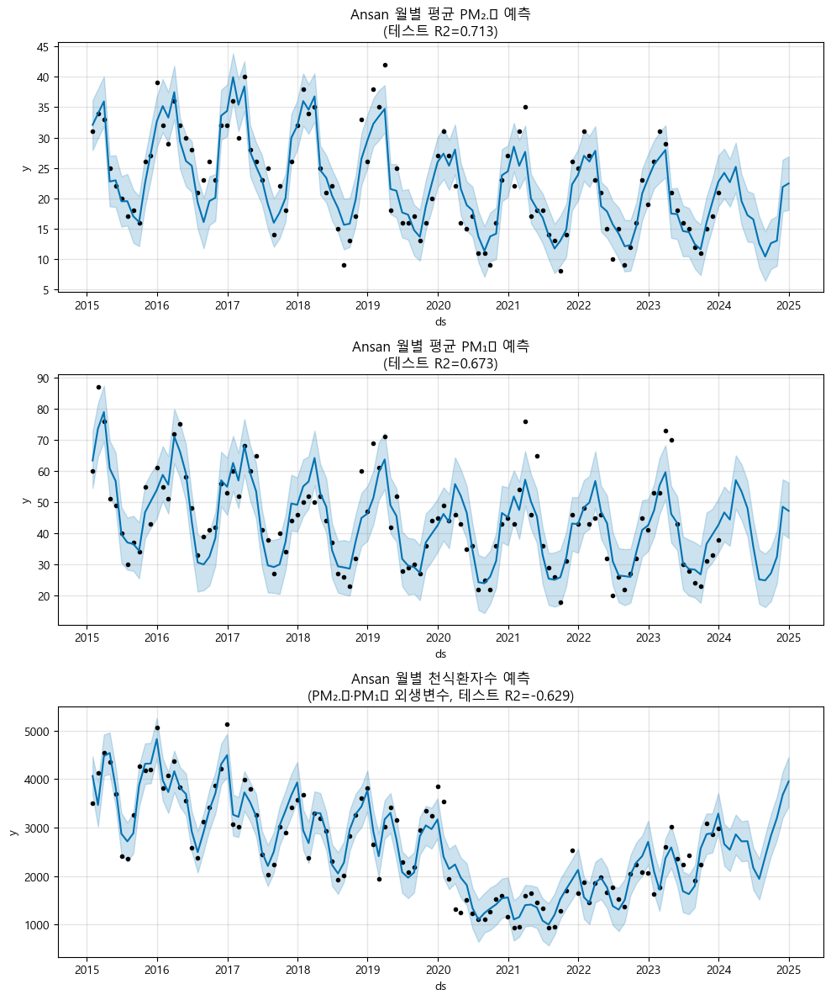

16:42:21 - cmdstanpy - INFO - Chain [1] start processing
16:42:21 - cmdstanpy - INFO - Chain [1] done processing



=== Anyang 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:22 - cmdstanpy - INFO - Chain [1] start processing
16:42:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:22 - cmdstanpy - INFO - Chain [1] start processing
16:42:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 15.603, RMSE: 3.950, R2: 0.661
PM10    ▶ MSE: 81.511, RMSE: 9.028, R2: 0.680
Asthma ▶ MSE: 186027.770, RMSE: 431.309, R2: -1.016


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


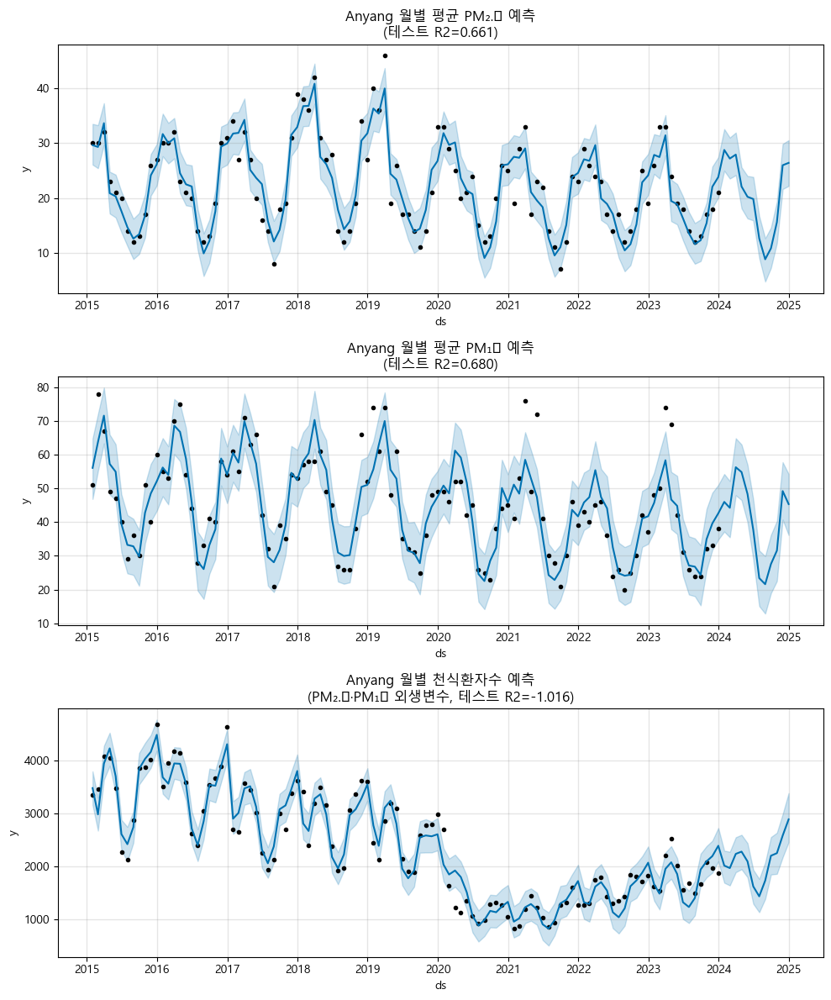

16:42:23 - cmdstanpy - INFO - Chain [1] start processing
16:42:23 - cmdstanpy - INFO - Chain [1] done processing



=== Bucheon 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:23 - cmdstanpy - INFO - Chain [1] start processing
16:42:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:23 - cmdstanpy - INFO - Chain [1] start processing
16:42:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 24.526, RMSE: 4.952, R2: 0.593
PM10    ▶ MSE: 87.001, RMSE: 9.327, R2: 0.730
Asthma ▶ MSE: 555592.426, RMSE: 745.381, R2: -1.150


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


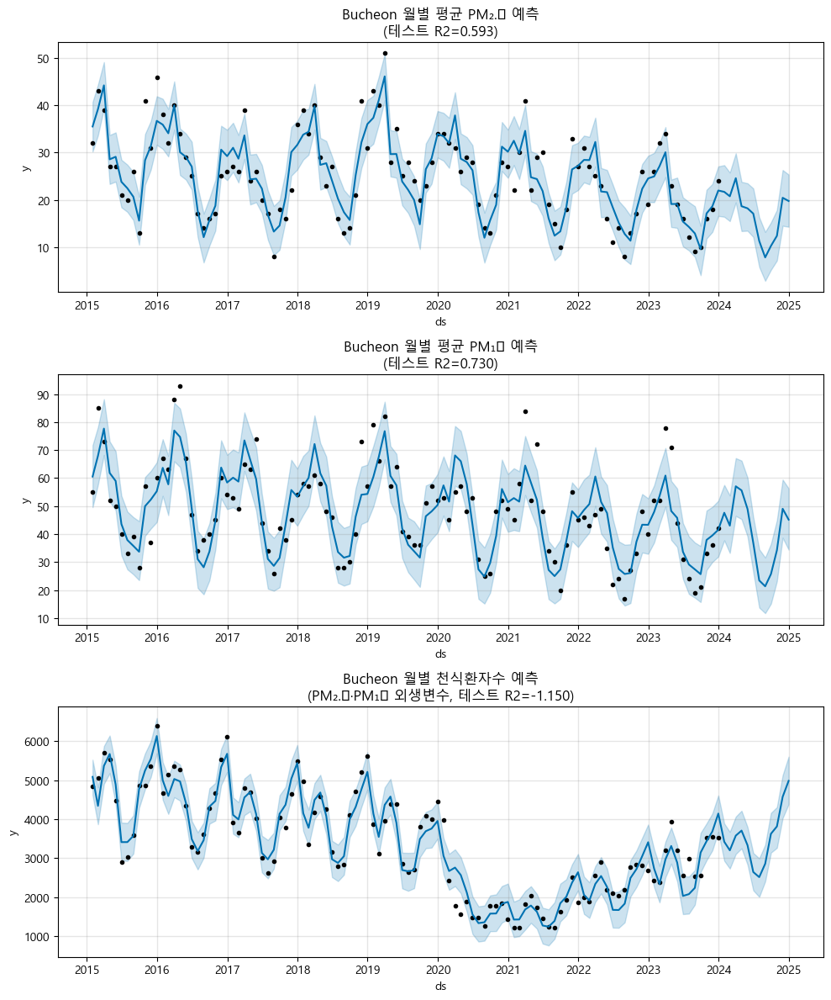

16:42:24 - cmdstanpy - INFO - Chain [1] start processing
16:42:24 - cmdstanpy - INFO - Chain [1] done processing



=== Busan 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:24 - cmdstanpy - INFO - Chain [1] start processing
16:42:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:24 - cmdstanpy - INFO - Chain [1] start processing
16:42:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 5.811, RMSE: 2.411, R2: 0.721
PM10    ▶ MSE: 79.137, RMSE: 8.896, R2: 0.584
Asthma ▶ MSE: 5386569.746, RMSE: 2320.898, R2: -1.111


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


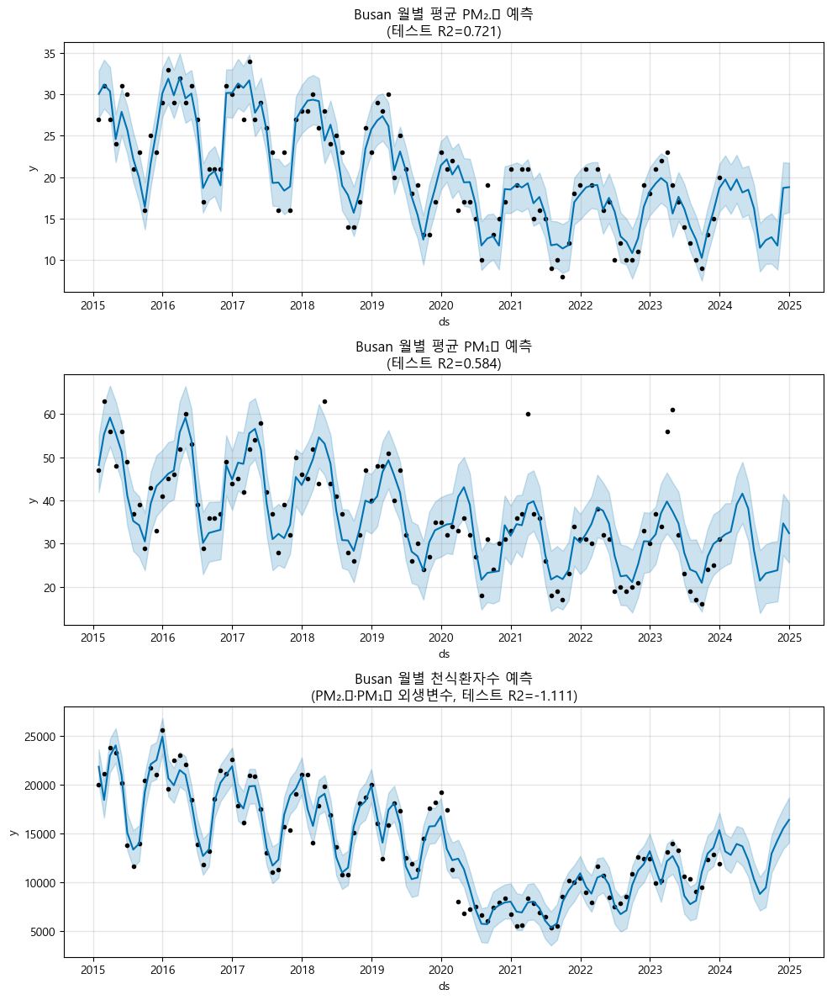

16:42:25 - cmdstanpy - INFO - Chain [1] start processing
16:42:25 - cmdstanpy - INFO - Chain [1] done processing



=== Cheongju 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:25 - cmdstanpy - INFO - Chain [1] start processing
16:42:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:25 - cmdstanpy - INFO - Chain [1] start processing
16:42:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 20.216, RMSE: 4.496, R2: 0.572
PM10    ▶ MSE: 119.686, RMSE: 10.940, R2: 0.601
Asthma ▶ MSE: 770737.127, RMSE: 877.916, R2: -0.645


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


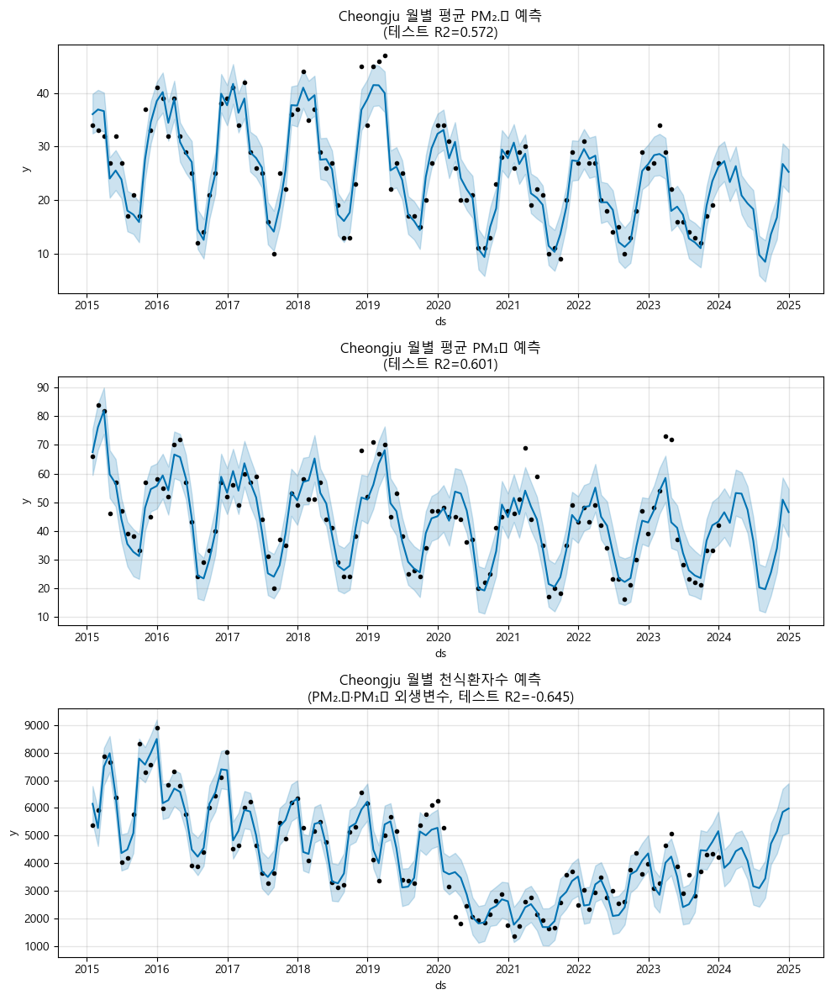

16:42:26 - cmdstanpy - INFO - Chain [1] start processing
16:42:26 - cmdstanpy - INFO - Chain [1] done processing



=== Daegu 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:26 - cmdstanpy - INFO - Chain [1] start processing
16:42:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:27 - cmdstanpy - INFO - Chain [1] start processing
16:42:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 11.346, RMSE: 3.368, R2: 0.631
PM10    ▶ MSE: 101.165, RMSE: 10.058, R2: 0.557
Asthma ▶ MSE: 3944324.184, RMSE: 1986.032, R2: -0.659


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


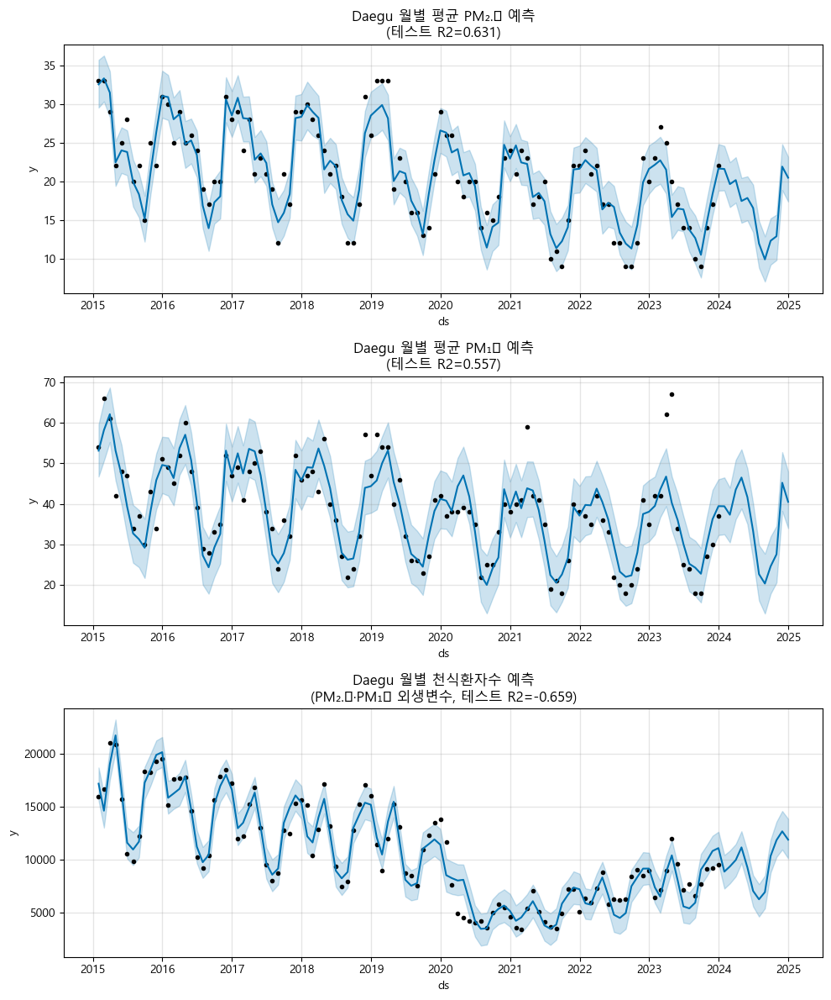

16:42:27 - cmdstanpy - INFO - Chain [1] start processing
16:42:27 - cmdstanpy - INFO - Chain [1] done processing



=== Daejeon 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:28 - cmdstanpy - INFO - Chain [1] start processing
16:42:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:28 - cmdstanpy - INFO - Chain [1] start processing
16:42:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 18.298, RMSE: 4.278, R2: 0.488
PM10    ▶ MSE: 103.917, RMSE: 10.194, R2: 0.587
Asthma ▶ MSE: 1301979.952, RMSE: 1141.043, R2: -0.660


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


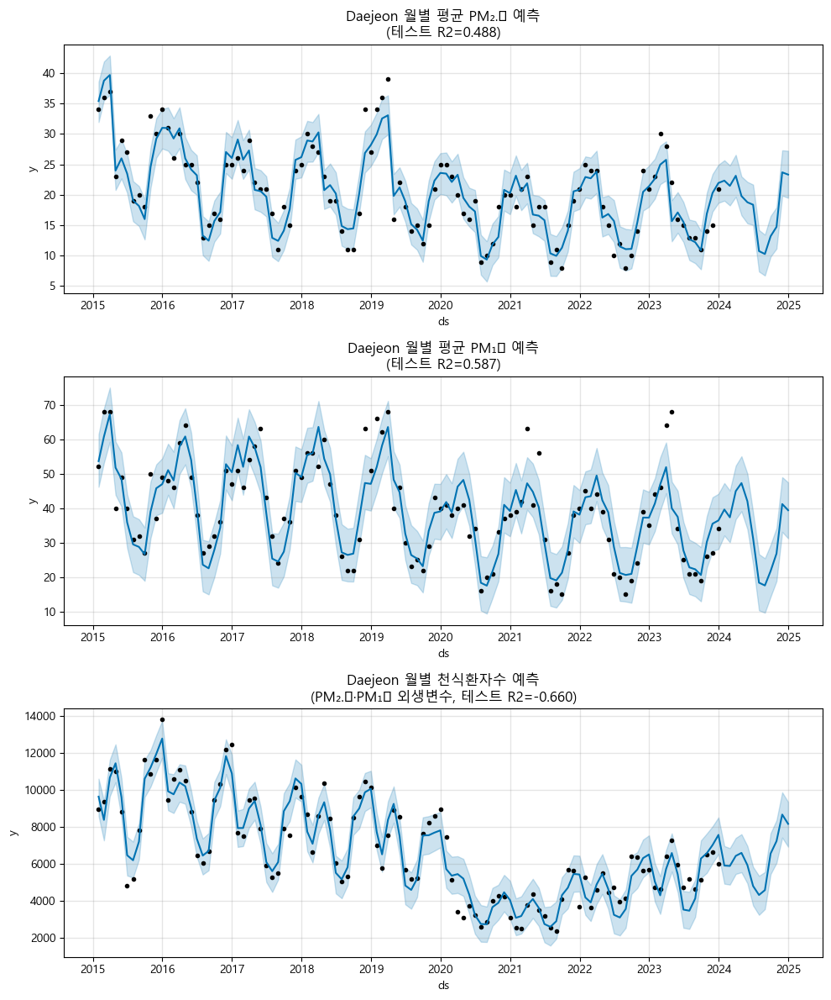

16:42:29 - cmdstanpy - INFO - Chain [1] start processing
16:42:29 - cmdstanpy - INFO - Chain [1] done processing



=== Dongducheon 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:29 - cmdstanpy - INFO - Chain [1] start processing
16:42:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:29 - cmdstanpy - INFO - Chain [1] start processing
16:42:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 7.938, RMSE: 2.817, R2: 0.758
PM10    ▶ MSE: 85.736, RMSE: 9.259, R2: 0.615
Asthma ▶ MSE: 1744.677, RMSE: 41.769, R2: -1.763


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


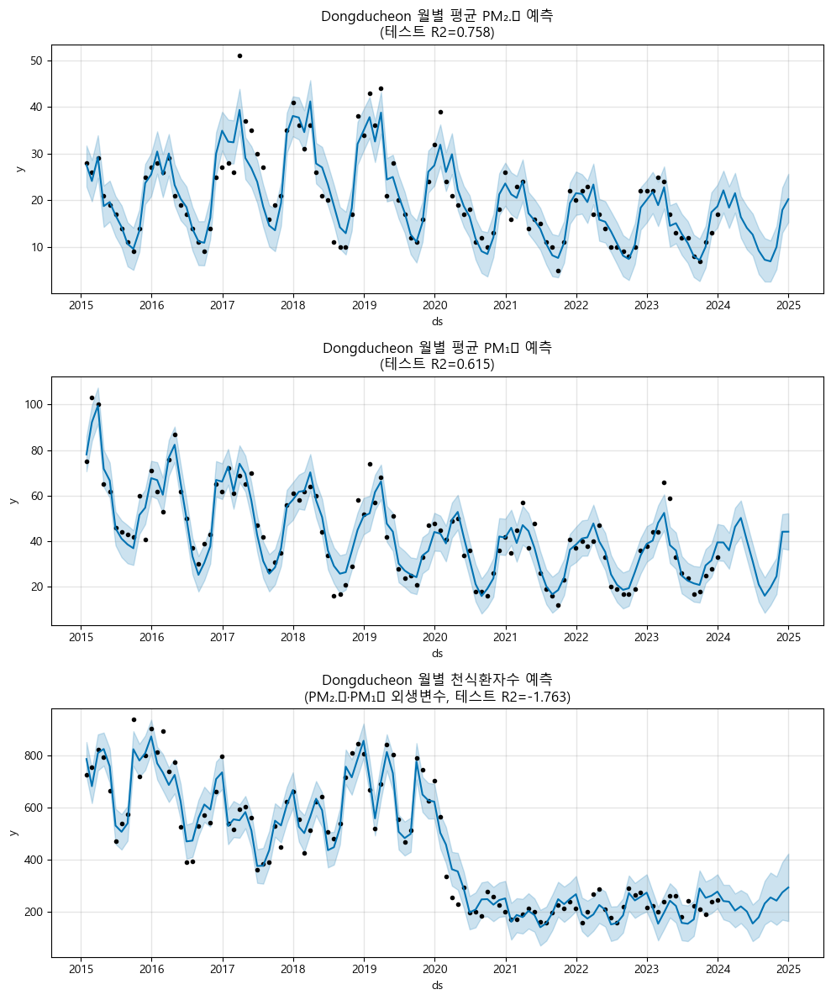

16:42:30 - cmdstanpy - INFO - Chain [1] start processing
16:42:30 - cmdstanpy - INFO - Chain [1] done processing



=== Goyang 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:30 - cmdstanpy - INFO - Chain [1] start processing
16:42:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:30 - cmdstanpy - INFO - Chain [1] start processing
16:42:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 12.976, RMSE: 3.602, R2: 0.578
PM10    ▶ MSE: 80.386, RMSE: 8.966, R2: 0.611
Asthma ▶ MSE: 1099122.488, RMSE: 1048.390, R2: -1.720


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


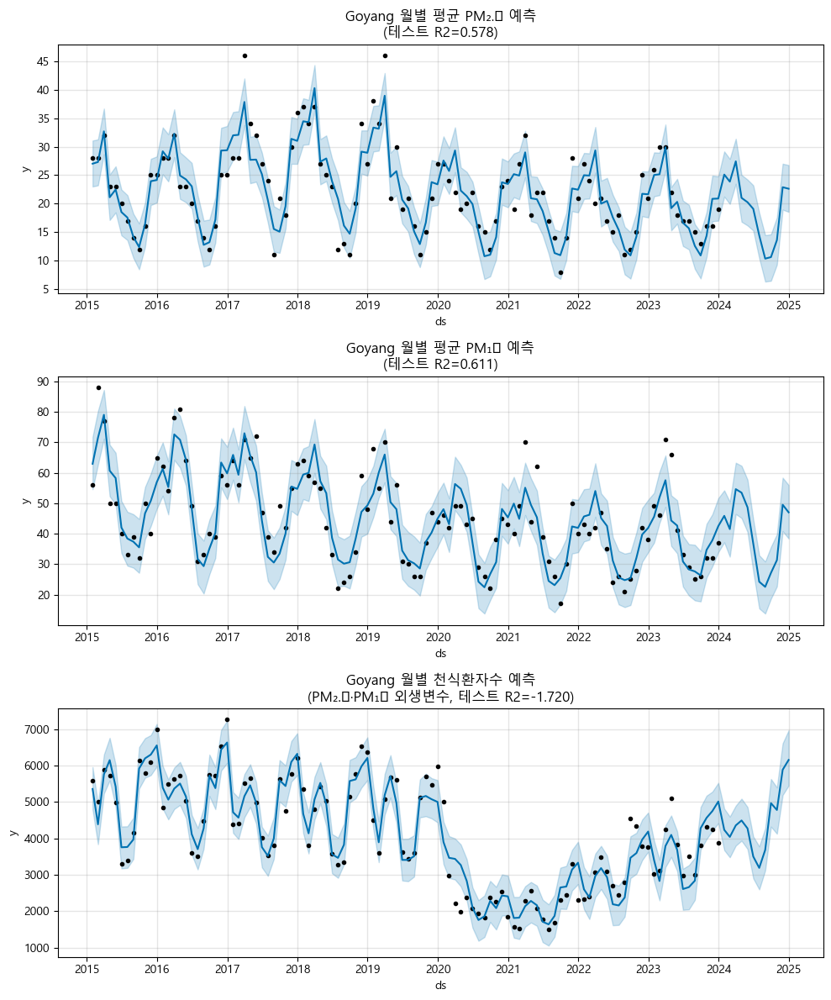

16:42:31 - cmdstanpy - INFO - Chain [1] start processing
16:42:31 - cmdstanpy - INFO - Chain [1] done processing



=== Gunpo 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:31 - cmdstanpy - INFO - Chain [1] start processing
16:42:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:32 - cmdstanpy - INFO - Chain [1] start processing
16:42:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 9.835, RMSE: 3.136, R2: 0.652
PM10    ▶ MSE: 96.718, RMSE: 9.835, R2: 0.640
Asthma ▶ MSE: 43825.169, RMSE: 209.345, R2: -1.026


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


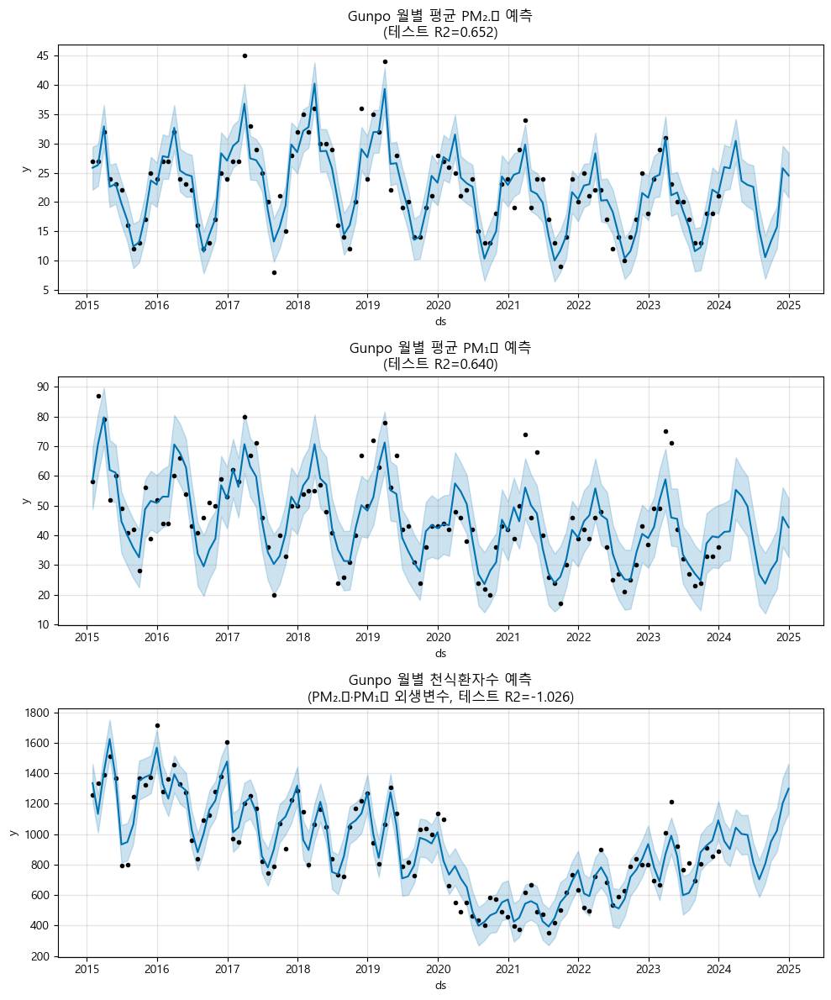

16:42:32 - cmdstanpy - INFO - Chain [1] start processing
16:42:33 - cmdstanpy - INFO - Chain [1] done processing



=== Guri 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:33 - cmdstanpy - INFO - Chain [1] start processing
16:42:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:33 - cmdstanpy - INFO - Chain [1] start processing
16:42:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 11.112, RMSE: 3.333, R2: 0.437
PM10    ▶ MSE: 96.484, RMSE: 9.823, R2: 0.608
Asthma ▶ MSE: 38466.476, RMSE: 196.129, R2: -1.625


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


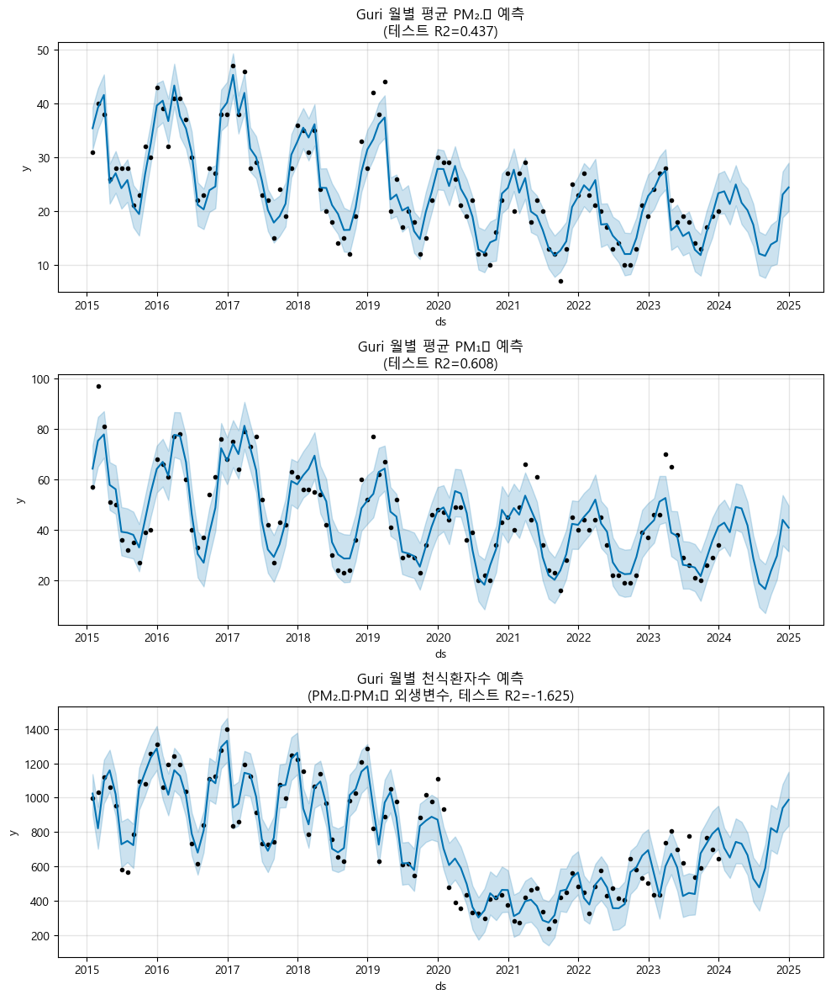

16:42:34 - cmdstanpy - INFO - Chain [1] start processing
16:42:34 - cmdstanpy - INFO - Chain [1] done processing



=== Gwacheon 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:34 - cmdstanpy - INFO - Chain [1] start processing
16:42:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:34 - cmdstanpy - INFO - Chain [1] start processing
16:42:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 7.447, RMSE: 2.729, R2: 0.830
PM10    ▶ MSE: 77.672, RMSE: 8.813, R2: 0.656
Asthma ▶ MSE: 2295.897, RMSE: 47.916, R2: -0.514


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


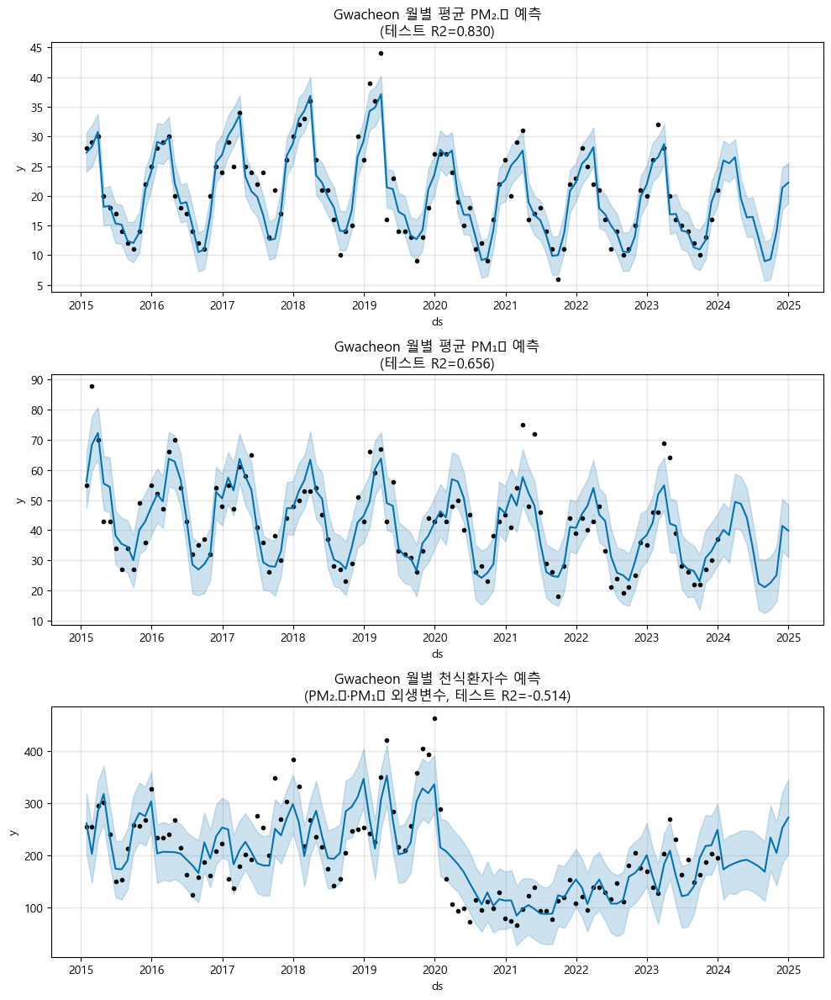

16:42:35 - cmdstanpy - INFO - Chain [1] start processing
16:42:35 - cmdstanpy - INFO - Chain [1] done processing



=== Gwangju 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:35 - cmdstanpy - INFO - Chain [1] start processing
16:42:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:36 - cmdstanpy - INFO - Chain [1] start processing
16:42:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 15.202, RMSE: 3.899, R2: 0.512
PM10    ▶ MSE: 100.988, RMSE: 10.049, R2: 0.547
Asthma ▶ MSE: 2511732.236, RMSE: 1584.845, R2: -1.732


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


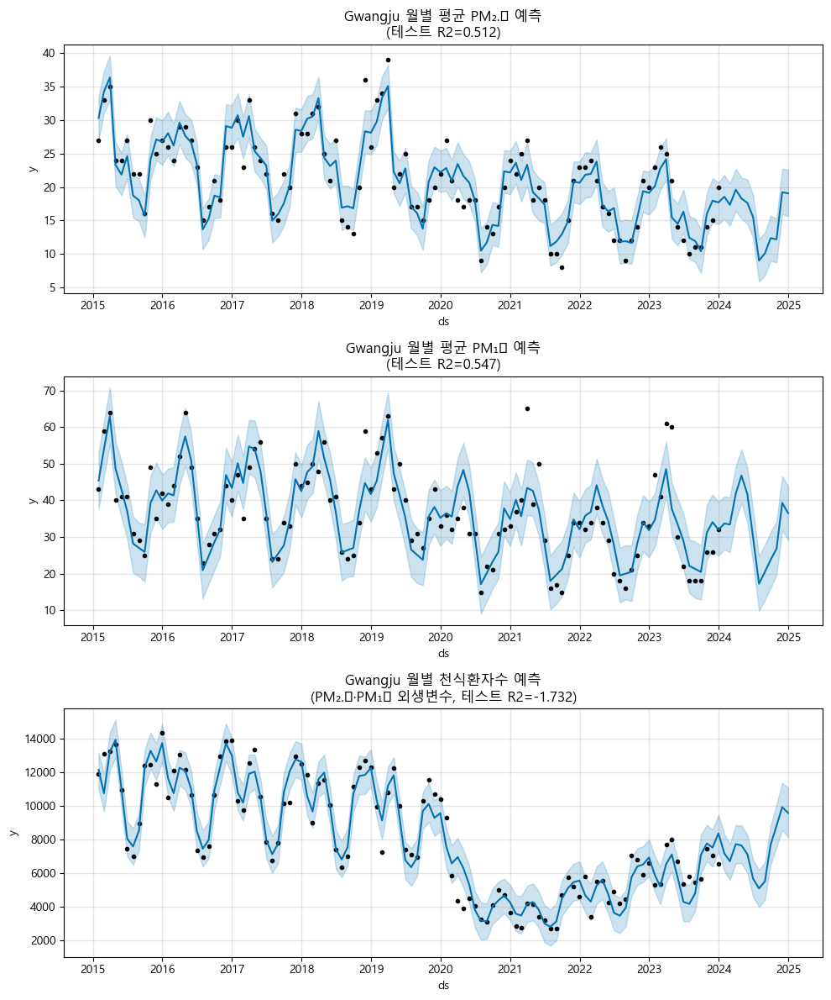

16:42:37 - cmdstanpy - INFO - Chain [1] start processing
16:42:37 - cmdstanpy - INFO - Chain [1] done processing



=== Gwangmyeong 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:37 - cmdstanpy - INFO - Chain [1] start processing
16:42:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:37 - cmdstanpy - INFO - Chain [1] start processing
16:42:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 12.296, RMSE: 3.507, R2: 0.786
PM10    ▶ MSE: 86.556, RMSE: 9.304, R2: 0.680
Asthma ▶ MSE: 9910.182, RMSE: 99.550, R2: -0.169


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


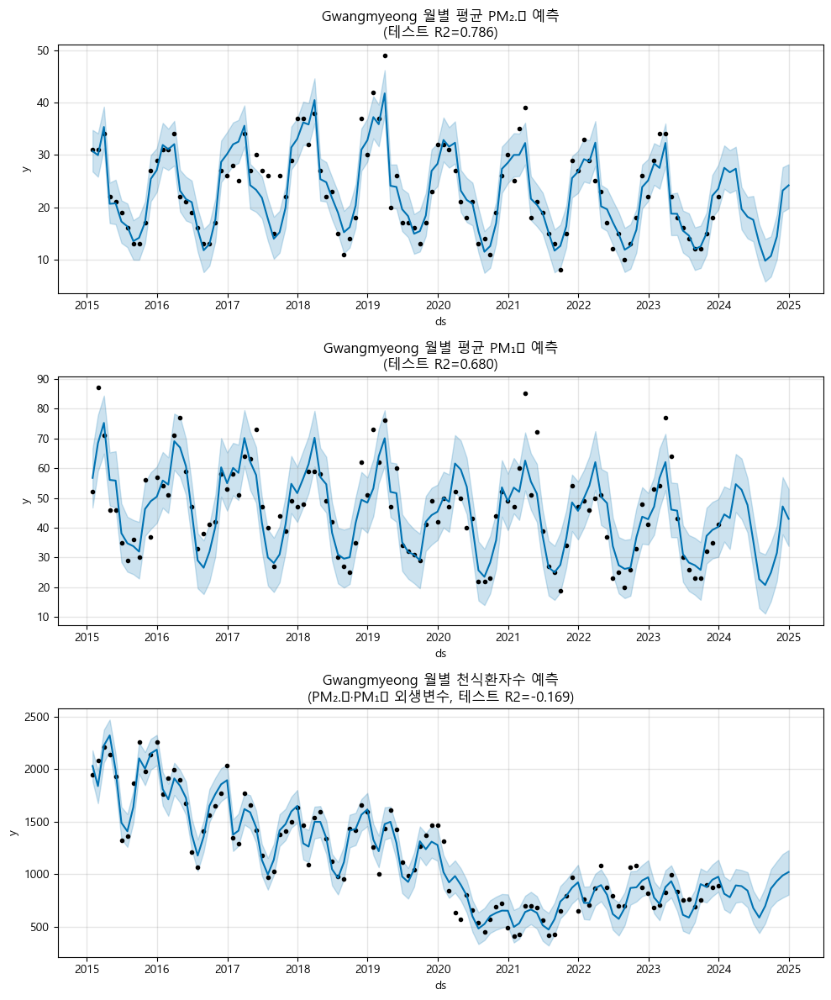

16:42:38 - cmdstanpy - INFO - Chain [1] start processing
16:42:38 - cmdstanpy - INFO - Chain [1] done processing



=== Hwaseong 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:38 - cmdstanpy - INFO - Chain [1] start processing
16:42:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:38 - cmdstanpy - INFO - Chain [1] start processing
16:42:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 12.575, RMSE: 3.546, R2: 0.695
PM10    ▶ MSE: 99.092, RMSE: 9.955, R2: 0.615
Asthma ▶ MSE: 786452.004, RMSE: 886.821, R2: -1.344


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


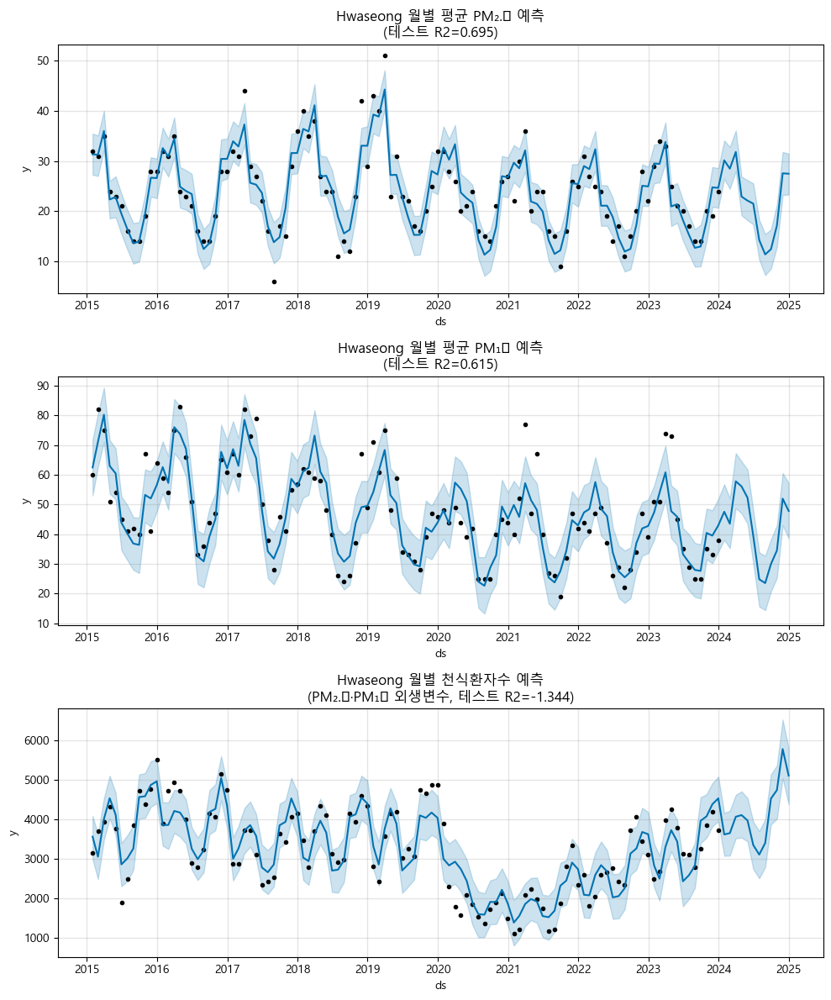

16:42:39 - cmdstanpy - INFO - Chain [1] start processing
16:42:39 - cmdstanpy - INFO - Chain [1] done processing



=== Icheon 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:39 - cmdstanpy - INFO - Chain [1] start processing
16:42:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:39 - cmdstanpy - INFO - Chain [1] start processing
16:42:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 12.223, RMSE: 3.496, R2: 0.724
PM10    ▶ MSE: 95.593, RMSE: 9.777, R2: 0.603
Asthma ▶ MSE: 18261.208, RMSE: 135.134, R2: -0.805


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


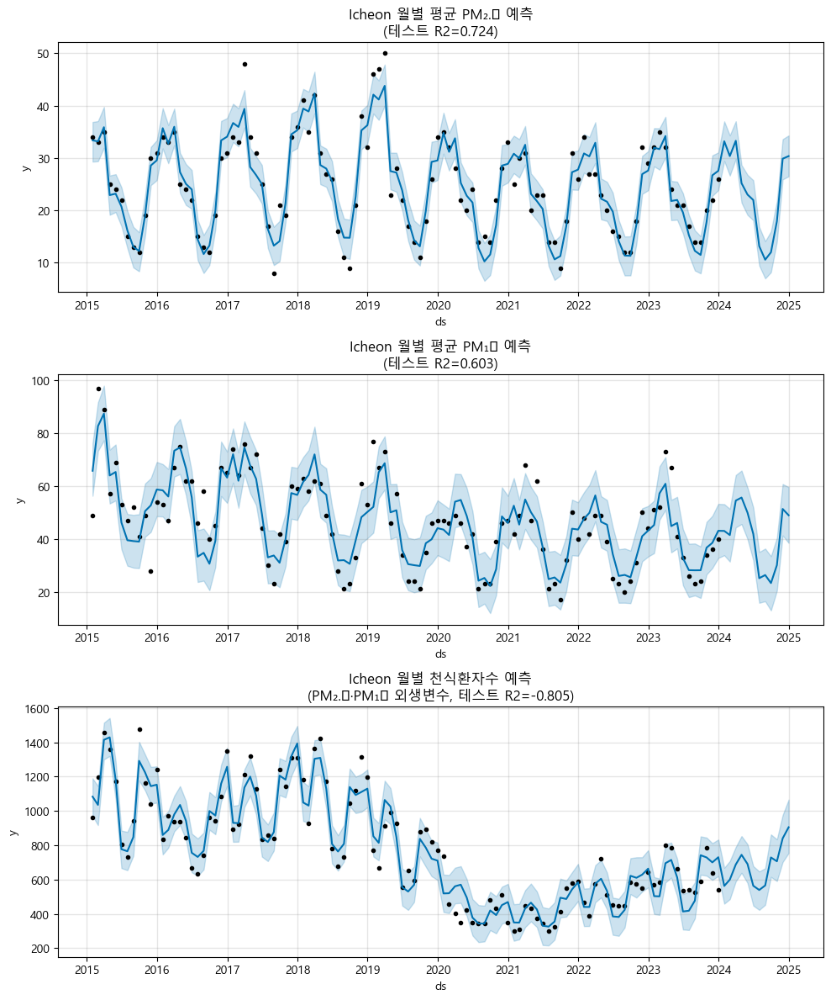

16:42:40 - cmdstanpy - INFO - Chain [1] start processing
16:42:40 - cmdstanpy - INFO - Chain [1] done processing



=== Iksan 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:41 - cmdstanpy - INFO - Chain [1] start processing
16:42:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:41 - cmdstanpy - INFO - Chain [1] start processing
16:42:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 24.305, RMSE: 4.930, R2: 0.586
PM10    ▶ MSE: 110.363, RMSE: 10.505, R2: 0.586
Asthma ▶ MSE: 125845.039, RMSE: 354.746, R2: -1.842


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


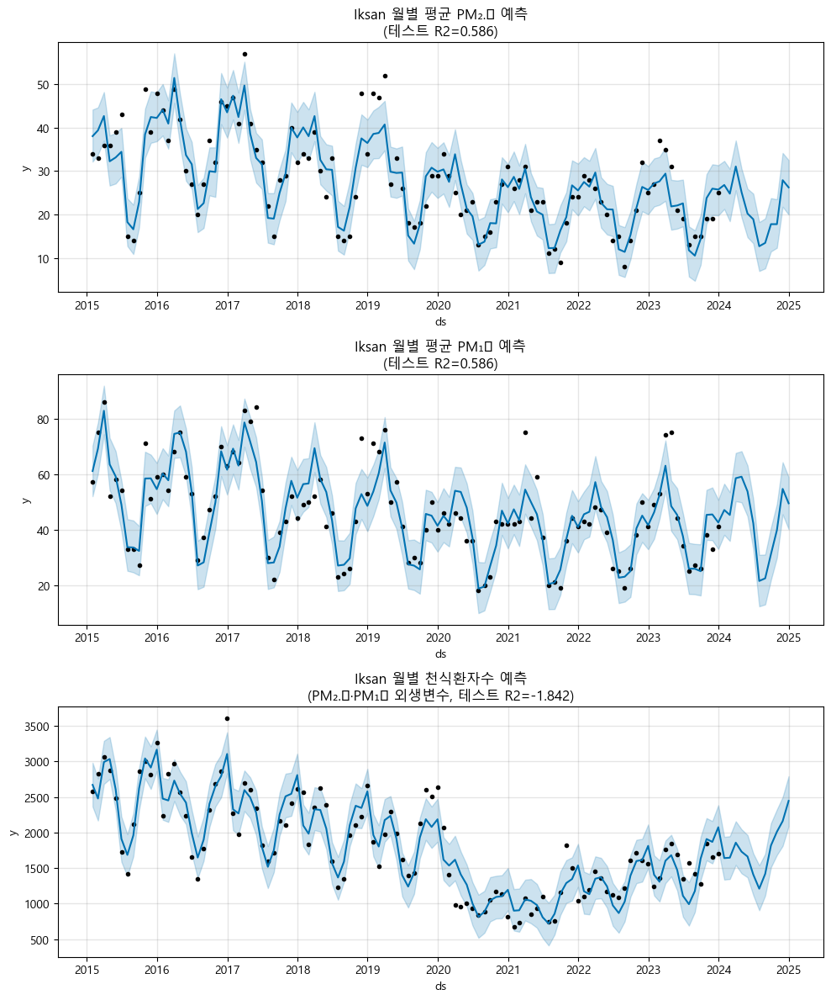

16:42:42 - cmdstanpy - INFO - Chain [1] start processing
16:42:42 - cmdstanpy - INFO - Chain [1] done processing



=== Incheon 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:42 - cmdstanpy - INFO - Chain [1] start processing
16:42:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:42 - cmdstanpy - INFO - Chain [1] start processing
16:42:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 12.469, RMSE: 3.531, R2: 0.646
PM10    ▶ MSE: 88.128, RMSE: 9.388, R2: 0.635
Asthma ▶ MSE: 8530745.111, RMSE: 2920.744, R2: -1.677


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


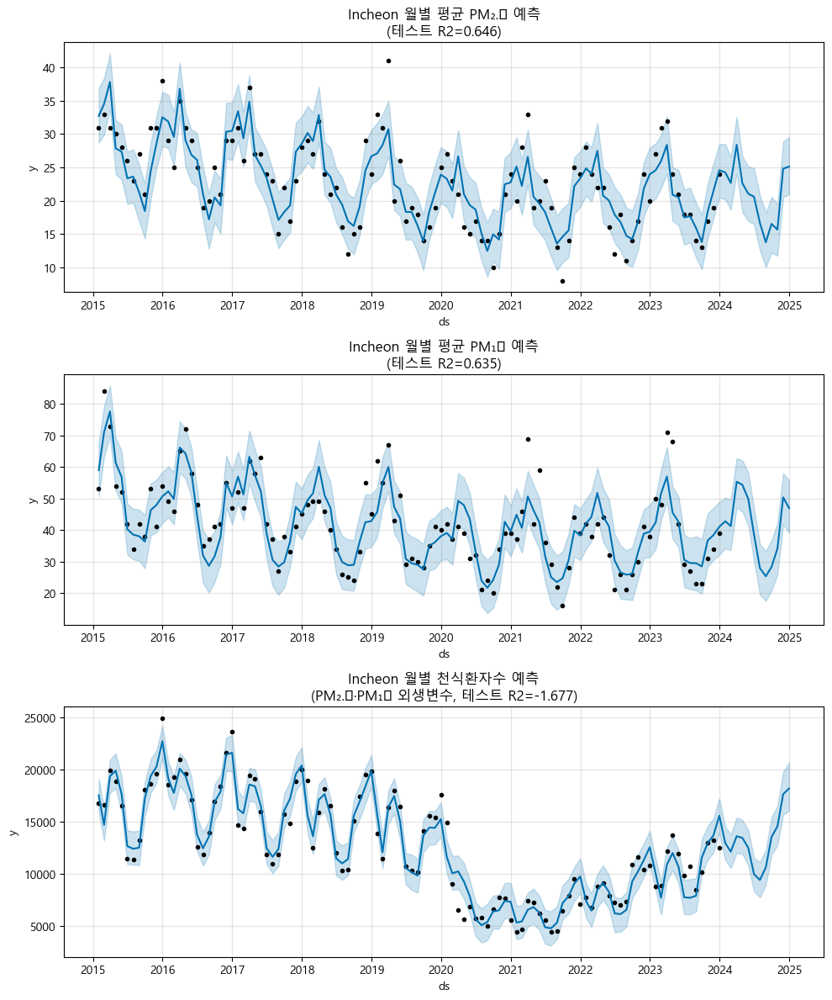

16:42:43 - cmdstanpy - INFO - Chain [1] start processing



=== Jeongeup 예측 및 평가 ===


16:42:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:43 - cmdstanpy - INFO - Chain [1] start processing
16:42:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:44 - cmdstanpy - INFO - Chain [1] start processing
16:42:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missi

PM2.5   ▶ MSE: 18.810, RMSE: 4.337, R2: 0.490
PM10    ▶ MSE: 105.363, RMSE: 10.265, R2: 0.478
Asthma ▶ MSE: 15082.281, RMSE: 122.810, R2: -2.312


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


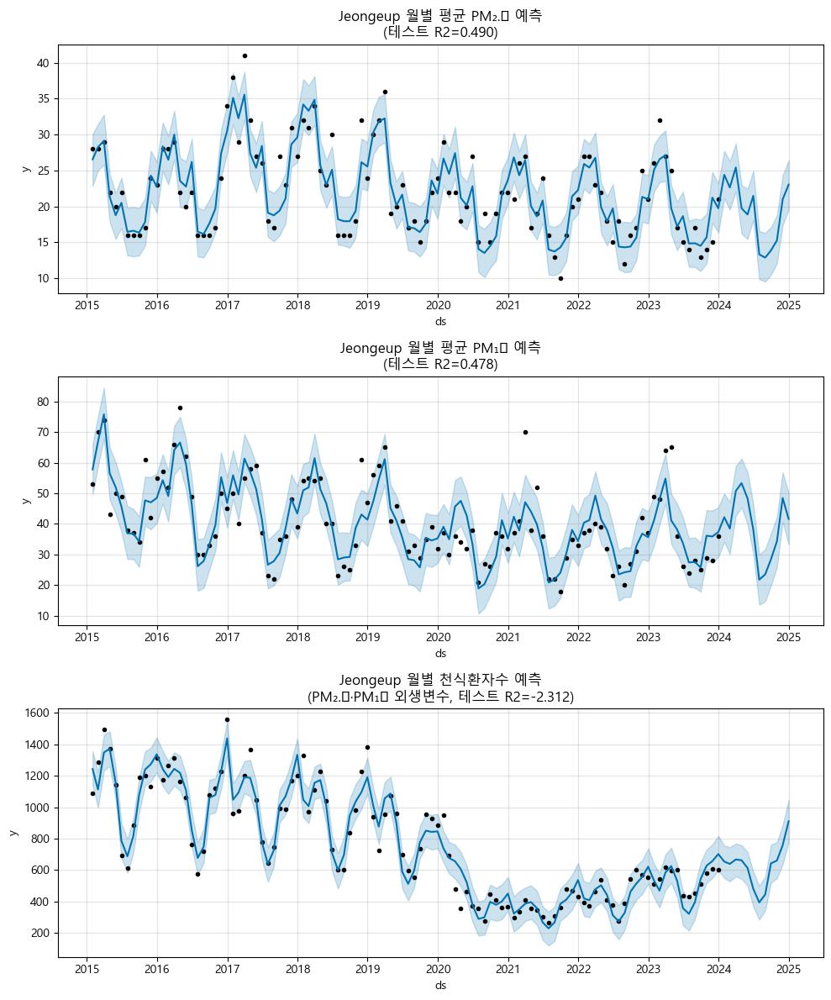

16:42:44 - cmdstanpy - INFO - Chain [1] start processing
16:42:44 - cmdstanpy - INFO - Chain [1] done processing



=== Osan 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:45 - cmdstanpy - INFO - Chain [1] start processing
16:42:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:45 - cmdstanpy - INFO - Chain [1] start processing
16:42:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 15.613, RMSE: 3.951, R2: 0.690
PM10    ▶ MSE: 112.484, RMSE: 10.606, R2: 0.561
Asthma ▶ MSE: 40325.254, RMSE: 200.811, R2: -0.342


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


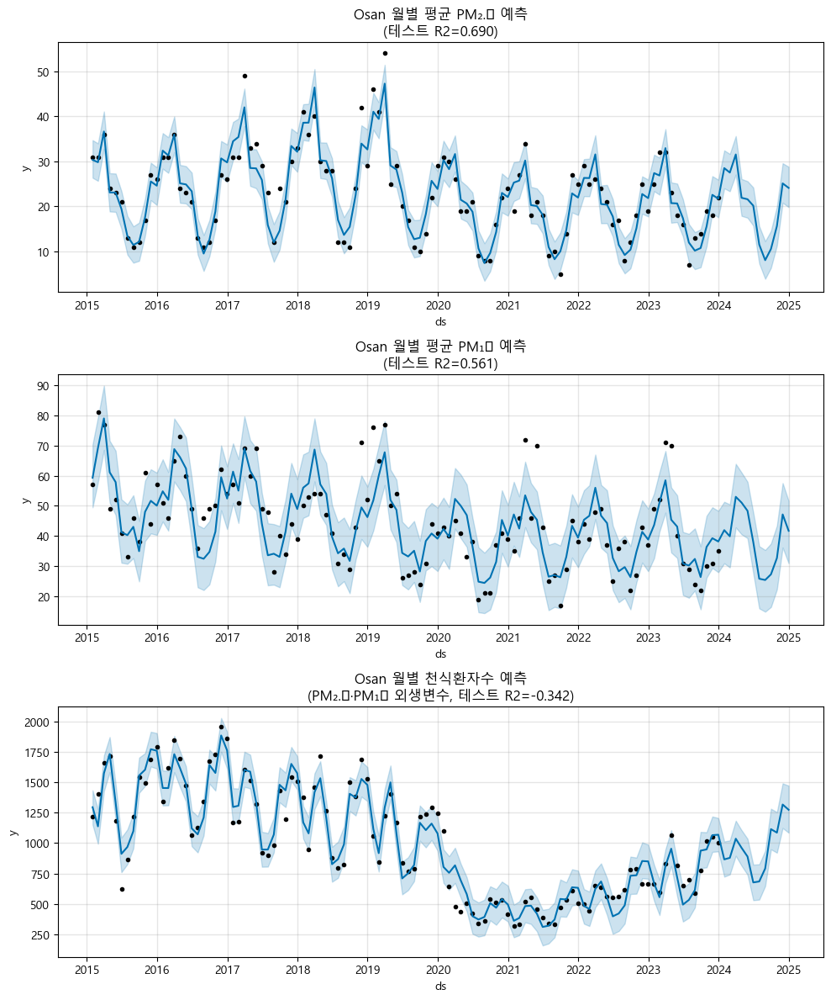

16:42:46 - cmdstanpy - INFO - Chain [1] start processing
16:42:46 - cmdstanpy - INFO - Chain [1] done processing



=== Paju 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:46 - cmdstanpy - INFO - Chain [1] start processing
16:42:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:46 - cmdstanpy - INFO - Chain [1] start processing
16:42:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 12.267, RMSE: 3.502, R2: 0.752
PM10    ▶ MSE: 86.955, RMSE: 9.325, R2: 0.640
Asthma ▶ MSE: 339988.949, RMSE: 583.086, R2: -0.692


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


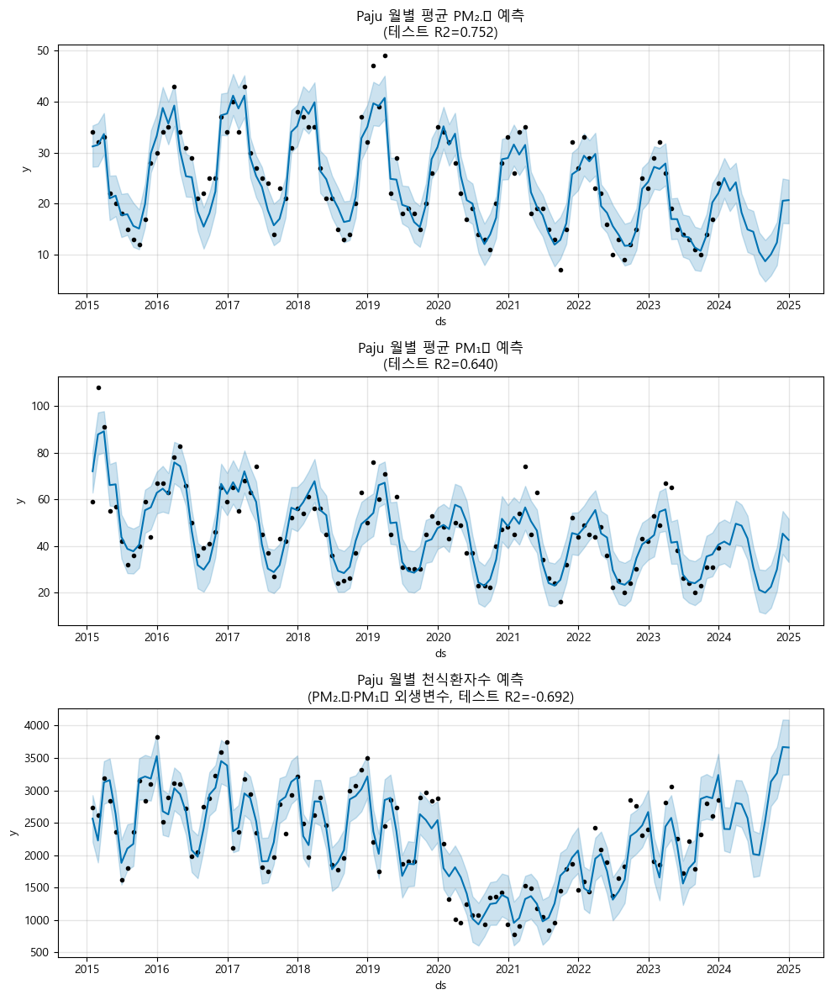


=== Pocheon 예측 및 평가 ===


16:42:47 - cmdstanpy - INFO - Chain [1] start processing
16:42:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:47 - cmdstanpy - INFO - Chain [1] start processing
16:42:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:48 - cmdstanpy - INFO - Chain [1] start processing
16:42:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.p

PM2.5   ▶ MSE: 21.445, RMSE: 4.631, R2: 0.653
PM10    ▶ MSE: 65.063, RMSE: 8.066, R2: 0.670
Asthma ▶ MSE: 8930.701, RMSE: 94.502, R2: -0.856


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


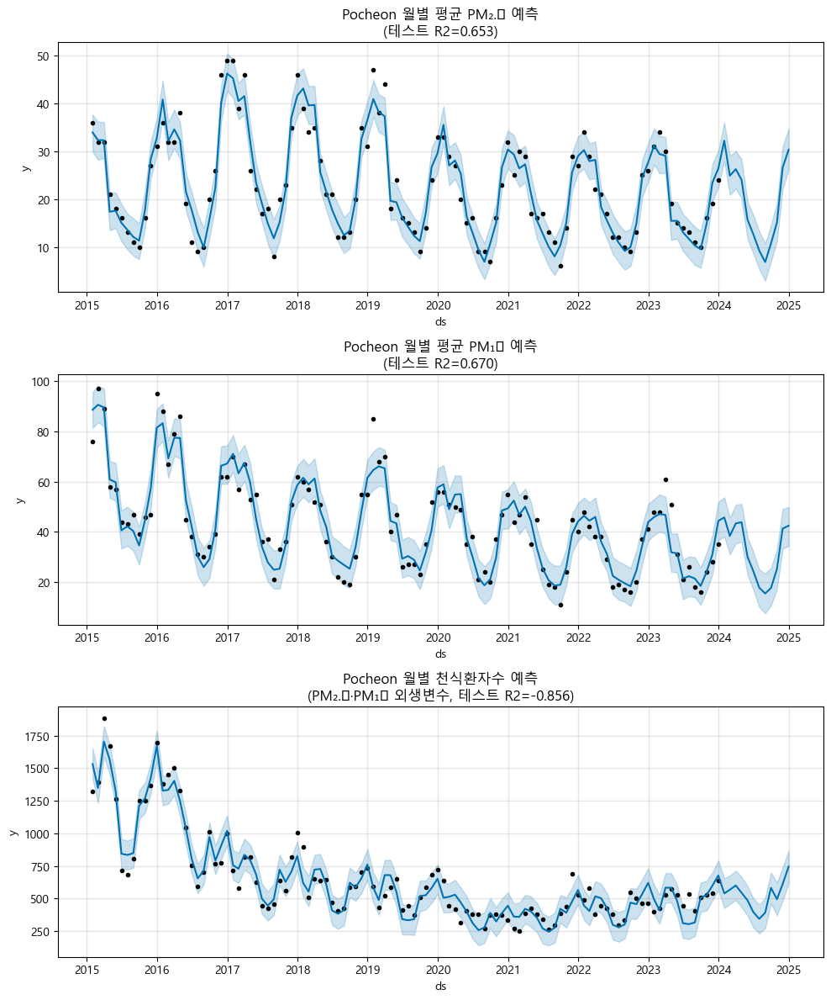

16:42:49 - cmdstanpy - INFO - Chain [1] start processing



=== Pyeongtaek 예측 및 평가 ===


16:42:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:49 - cmdstanpy - INFO - Chain [1] start processing
16:42:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:49 - cmdstanpy - INFO - Chain [1] start processing
16:42:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missi

PM2.5   ▶ MSE: 16.787, RMSE: 4.097, R2: 0.632
PM10    ▶ MSE: 114.023, RMSE: 10.678, R2: 0.591
Asthma ▶ MSE: 669521.376, RMSE: 818.243, R2: -1.050


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


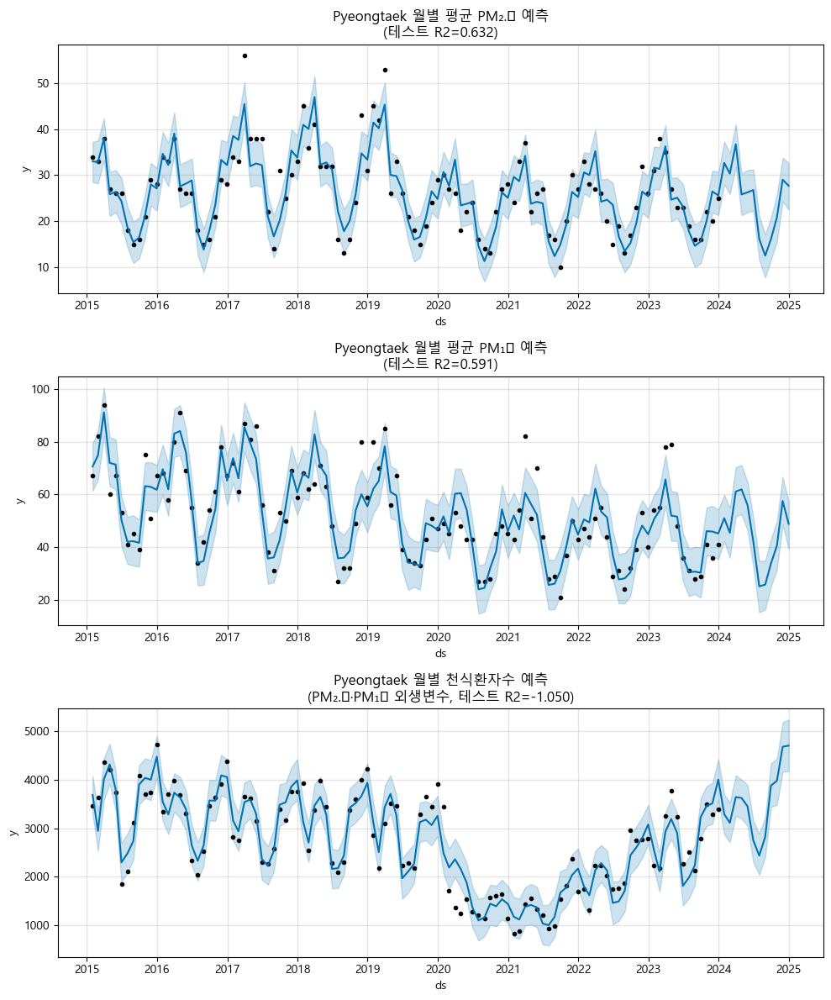

16:42:50 - cmdstanpy - INFO - Chain [1] start processing



=== Seongnam 예측 및 평가 ===


16:42:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:50 - cmdstanpy - INFO - Chain [1] start processing
16:42:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:50 - cmdstanpy - INFO - Chain [1] start processing
16:42:50 - cmdstanpy - INFO - Chain [1] done processing


PM2.5   ▶ MSE: 17.317, RMSE: 4.161, R2: 0.621
PM10    ▶ MSE: 88.719, RMSE: 9.419, R2: 0.627
Asthma ▶ MSE: 544690.421, RMSE: 738.031, R2: -1.059


C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


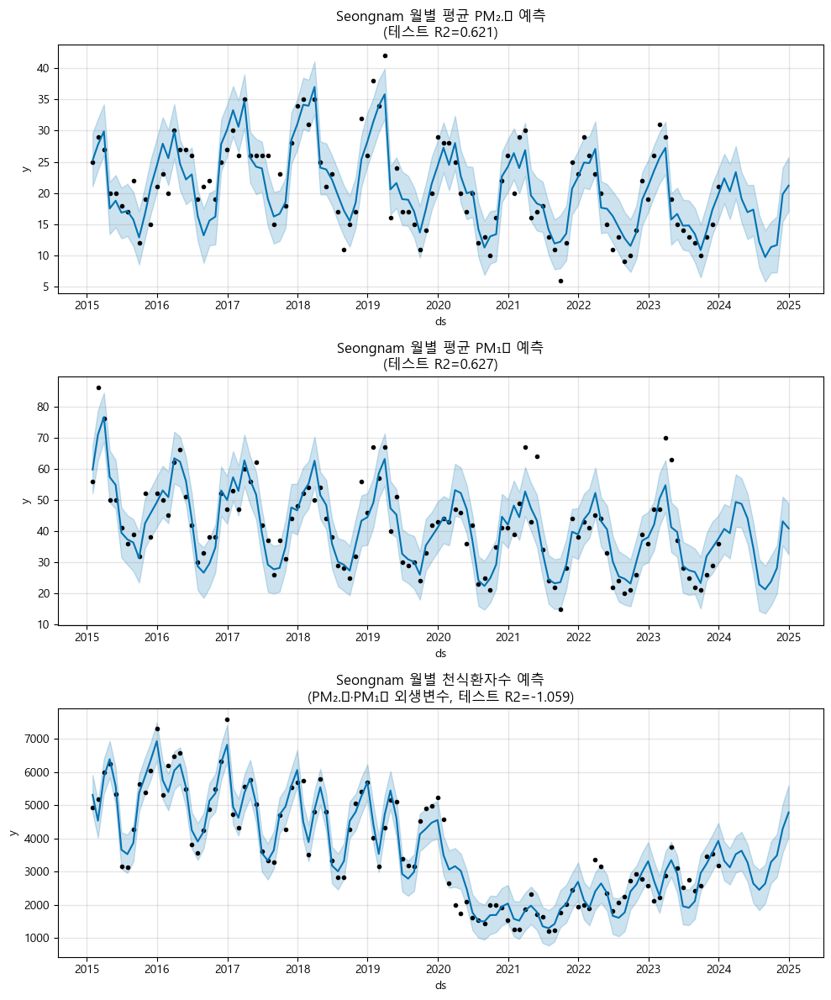

16:42:52 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1] done processing



=== Seoul 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:52 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:52 - cmdstanpy - INFO - Chain [1] start processing
16:42:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 11.987, RMSE: 3.462, R2: 0.676
PM10    ▶ MSE: 78.360, RMSE: 8.852, R2: 0.653
Asthma ▶ MSE: 64032339.653, RMSE: 8002.021, R2: -1.731


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


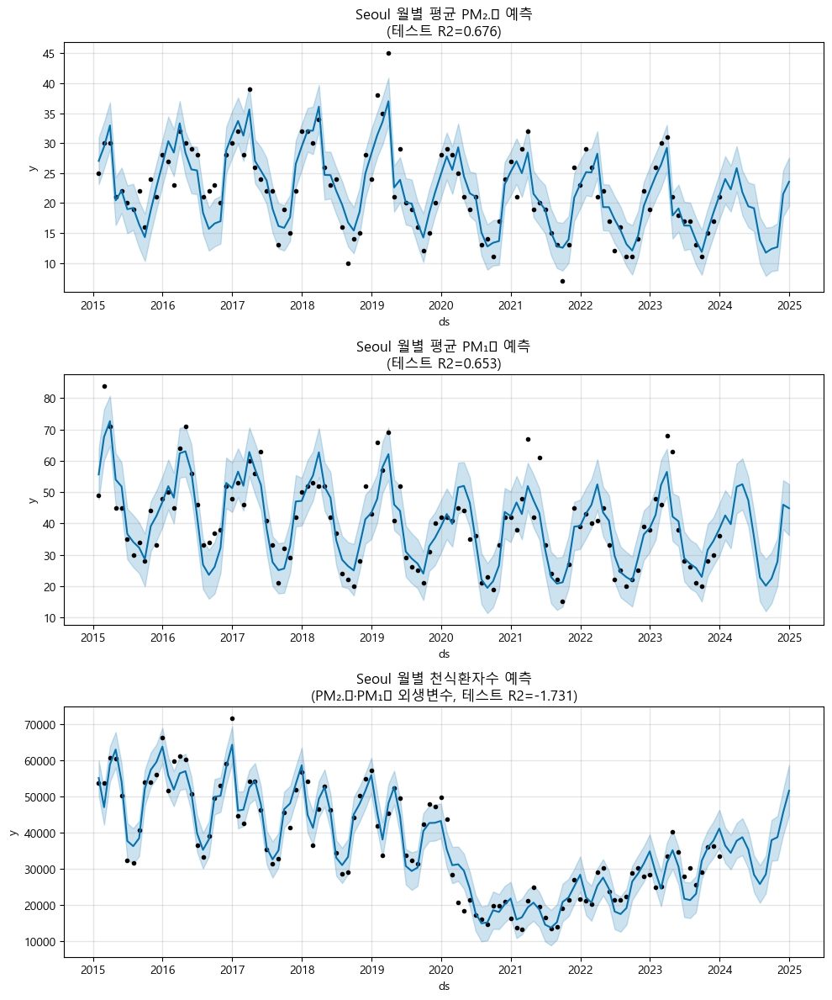

16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing



=== Siheung 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 11.330, RMSE: 3.366, R2: 0.701
PM10    ▶ MSE: 94.986, RMSE: 9.746, R2: 0.651
Asthma ▶ MSE: 157797.659, RMSE: 397.238, R2: -1.488


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


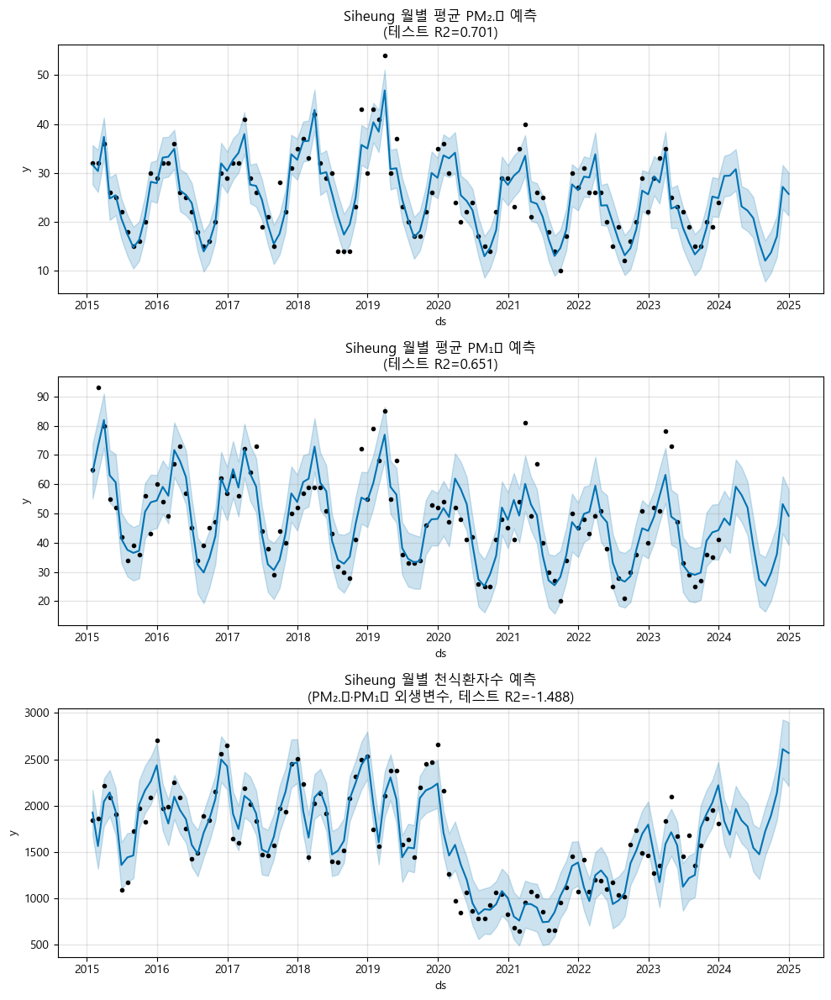

16:42:54 - cmdstanpy - INFO - Chain [1] start processing
16:42:54 - cmdstanpy - INFO - Chain [1] done processing



=== Suwon 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:55 - cmdstanpy - INFO - Chain [1] start processing
16:42:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:55 - cmdstanpy - INFO - Chain [1] start processing
16:42:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 11.614, RMSE: 3.408, R2: 0.670
PM10    ▶ MSE: 89.310, RMSE: 9.450, R2: 0.649
Asthma ▶ MSE: 2513356.961, RMSE: 1585.357, R2: -1.978


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


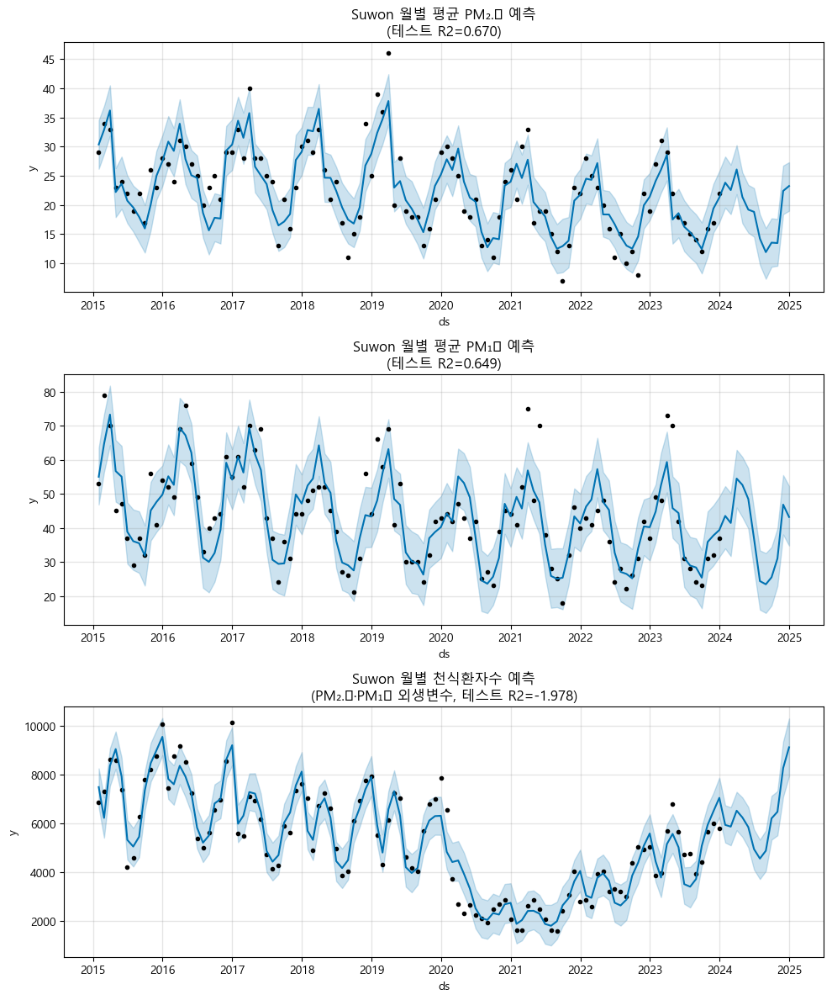

16:42:56 - cmdstanpy - INFO - Chain [1] start processing



=== Uijeongbu 예측 및 평가 ===


16:42:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:56 - cmdstanpy - INFO - Chain [1] start processing
16:42:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:56 - cmdstanpy - INFO - Chain [1] start processing
16:42:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missi

PM2.5   ▶ MSE: 15.763, RMSE: 3.970, R2: 0.563
PM10    ▶ MSE: 83.616, RMSE: 9.144, R2: 0.611
Asthma ▶ MSE: 114587.094, RMSE: 338.507, R2: -1.009


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


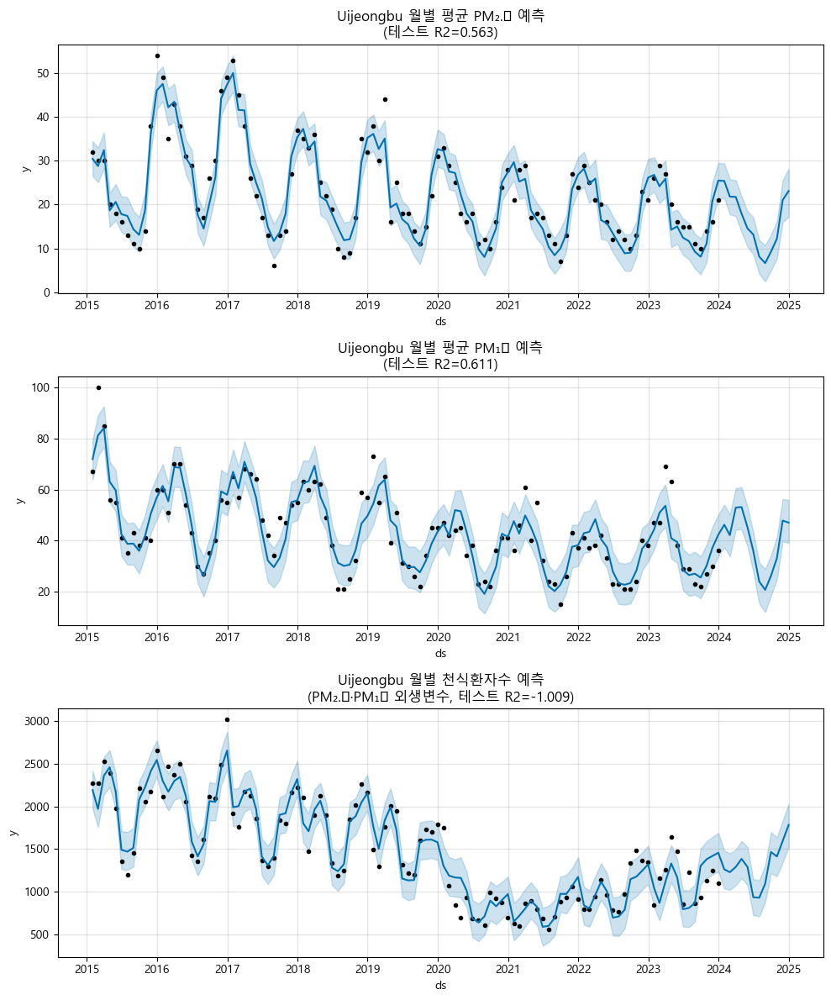

16:42:57 - cmdstanpy - INFO - Chain [1] start processing
16:42:57 - cmdstanpy - INFO - Chain [1] done processing



=== Uiwang 예측 및 평가 ===


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:57 - cmdstanpy - INFO - Chain [1] start processing
16:42:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:57 - cmdstanpy - INFO - Chain [1] start processing
16:42:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()


PM2.5   ▶ MSE: 13.052, RMSE: 3.613, R2: 0.767
PM10    ▶ MSE: 103.054, RMSE: 10.152, R2: 0.579
Asthma ▶ MSE: 29363.724, RMSE: 171.358, R2: -1.022


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


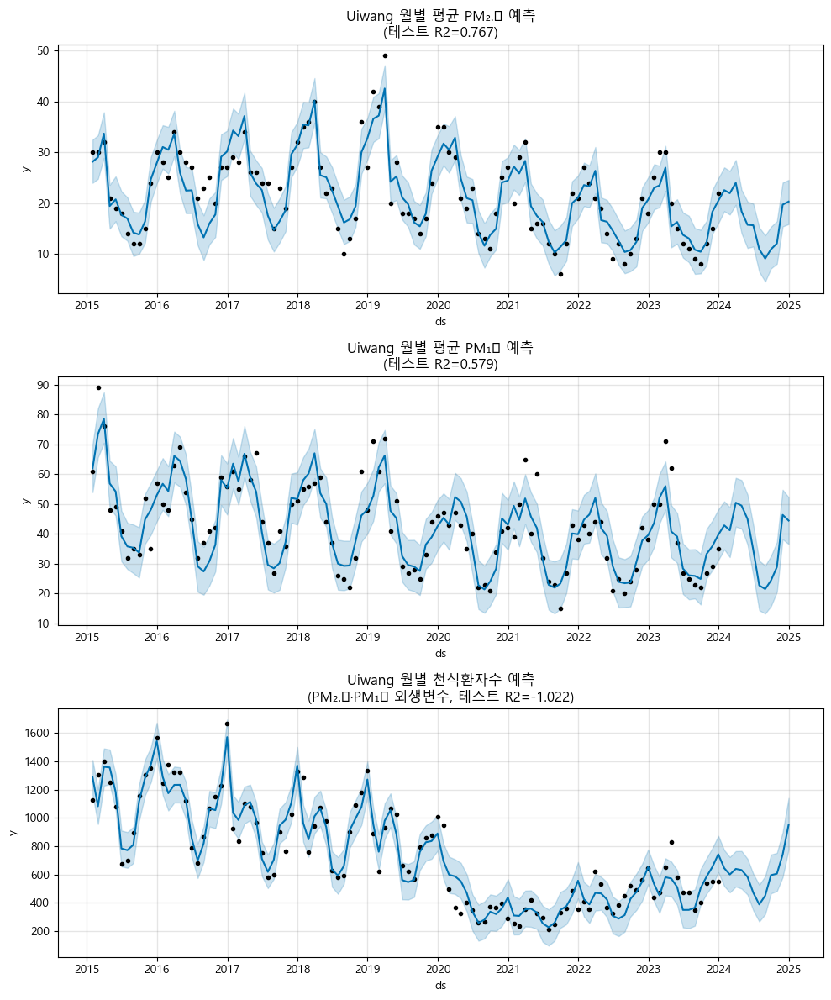


=== Ulsan 예측 및 평가 ===


16:42:58 - cmdstanpy - INFO - Chain [1] start processing
16:42:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:59 - cmdstanpy - INFO - Chain [1] start processing
16:42:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:42:59 - cmdstanpy - INFO - Chain [1] start processing
16:42:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.p

PM2.5   ▶ MSE: 10.742, RMSE: 3.277, R2: 0.231
PM10    ▶ MSE: 83.113, RMSE: 9.117, R2: 0.512
Asthma ▶ MSE: 841058.690, RMSE: 917.093, R2: -0.071


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


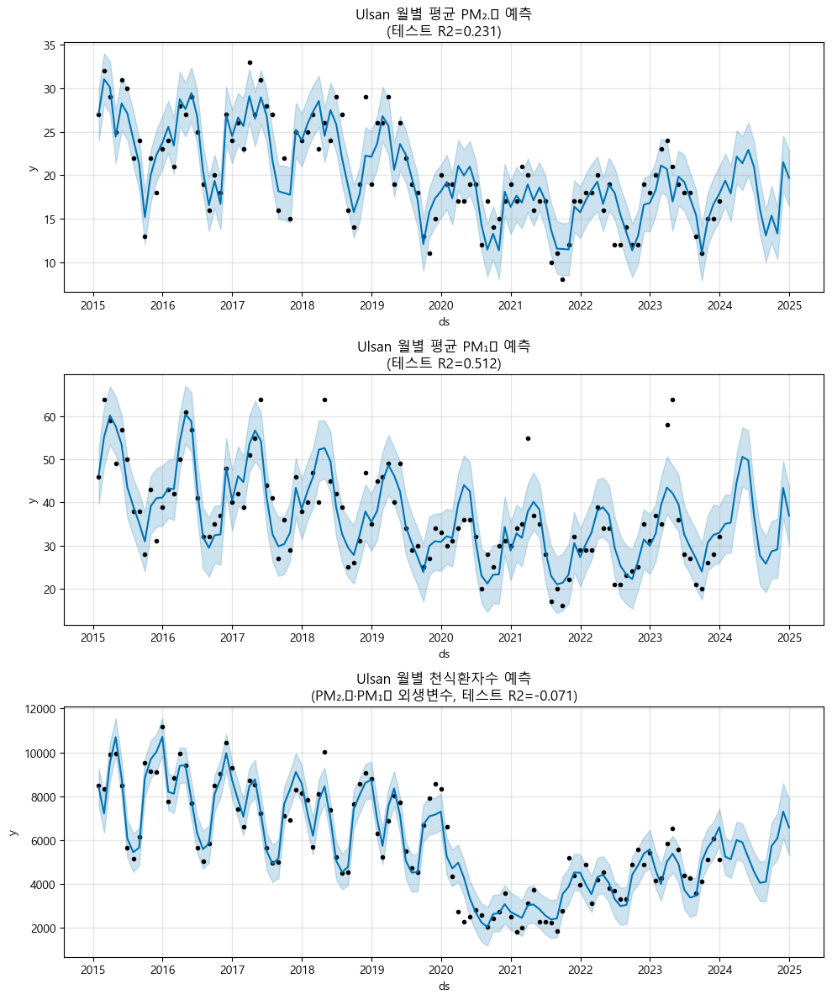

16:43:00 - cmdstanpy - INFO - Chain [1] start processing



=== Wonju 예측 및 평가 ===


16:43:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:00 - cmdstanpy - INFO - Chain [1] start processing
16:43:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:00 - cmdstanpy - INFO - Chain [1] start processing
16:43:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missi

PM2.5   ▶ MSE: 12.301, RMSE: 3.507, R2: 0.740
PM10    ▶ MSE: 78.061, RMSE: 8.835, R2: 0.527
Asthma ▶ MSE: 35390.011, RMSE: 188.122, R2: -0.995


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


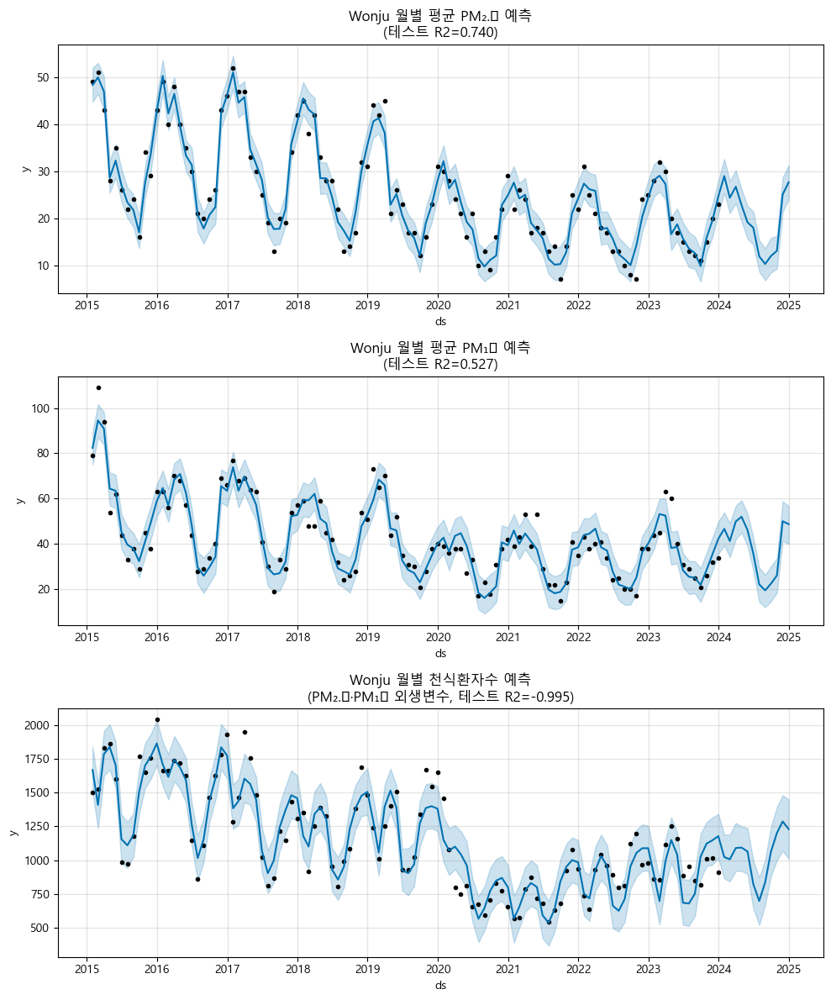

16:43:01 - cmdstanpy - INFO - Chain [1] start processing



=== Yangju 예측 및 평가 ===


16:43:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:01 - cmdstanpy - INFO - Chain [1] start processing
16:43:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:02 - cmdstanpy - INFO - Chain [1] start processing
16:43:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missi

PM2.5   ▶ MSE: 19.645, RMSE: 4.432, R2: 0.587
PM10    ▶ MSE: 119.670, RMSE: 10.939, R2: 0.537
Asthma ▶ MSE: 184923.906, RMSE: 430.028, R2: -3.355


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


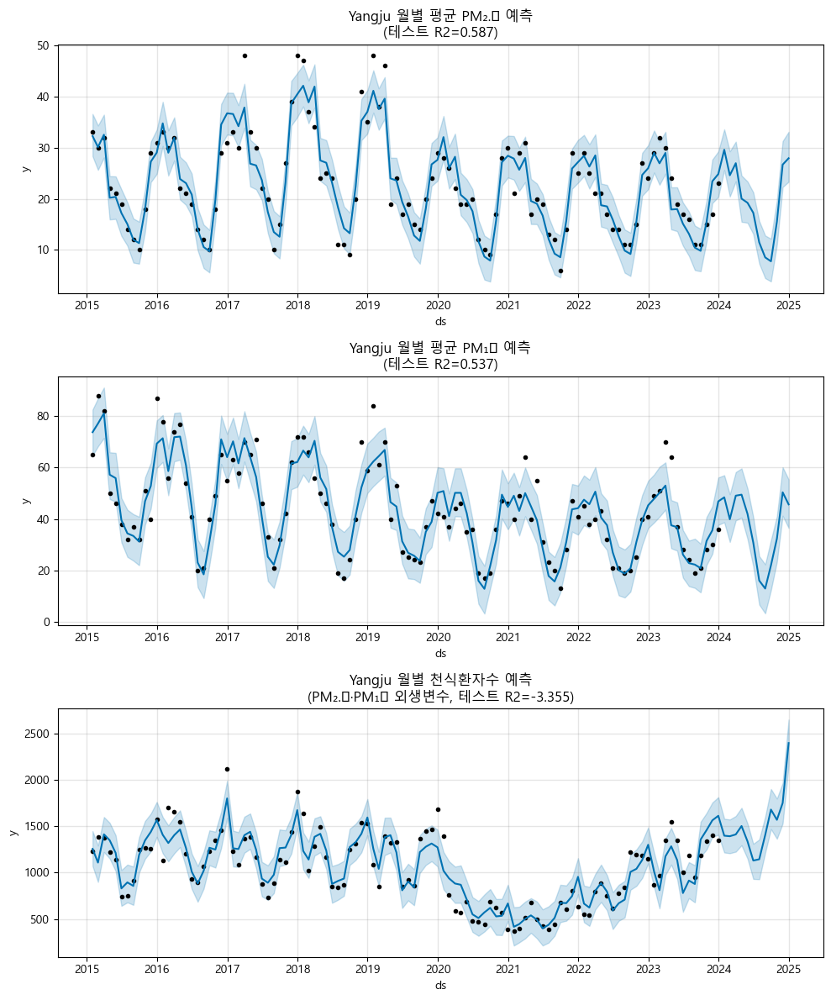

16:43:02 - cmdstanpy - INFO - Chain [1] start processing



=== Yeongju 예측 및 평가 ===


16:43:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:03 - cmdstanpy - INFO - Chain [1] start processing
16:43:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:03 - cmdstanpy - INFO - Chain [1] start processing
16:43:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missi

PM2.5   ▶ MSE: 12.799, RMSE: 3.578, R2: 0.778
PM10    ▶ MSE: 178.993, RMSE: 13.379, R2: 0.136
Asthma ▶ MSE: 3307.563, RMSE: 57.511, R2: 0.255


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


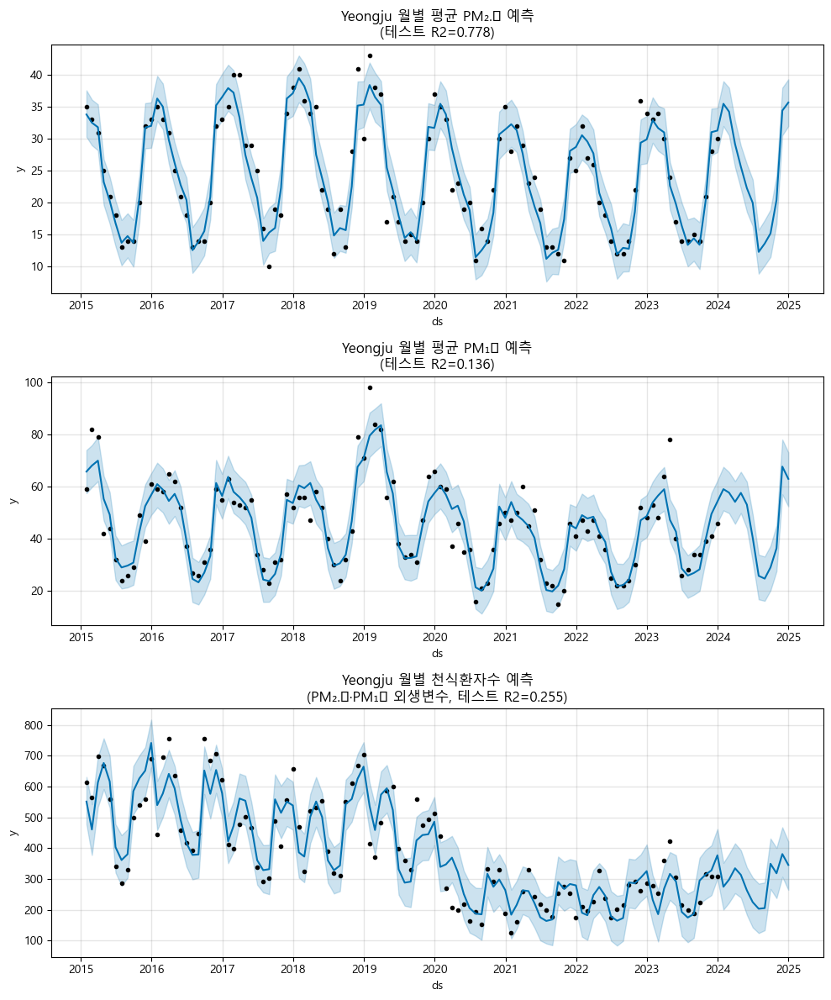

16:43:04 - cmdstanpy - INFO - Chain [1] start processing



=== Yongin 예측 및 평가 ===


16:43:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:04 - cmdstanpy - INFO - Chain [1] start processing
16:43:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:05 - cmdstanpy - INFO - Chain [1] start processing
16:43:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\1994987266.py:115: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missi

PM2.5   ▶ MSE: 9.607, RMSE: 3.100, R2: 0.862
PM10    ▶ MSE: 100.459, RMSE: 10.023, R2: 0.643
Asthma ▶ MSE: 969865.665, RMSE: 984.818, R2: -0.954


f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


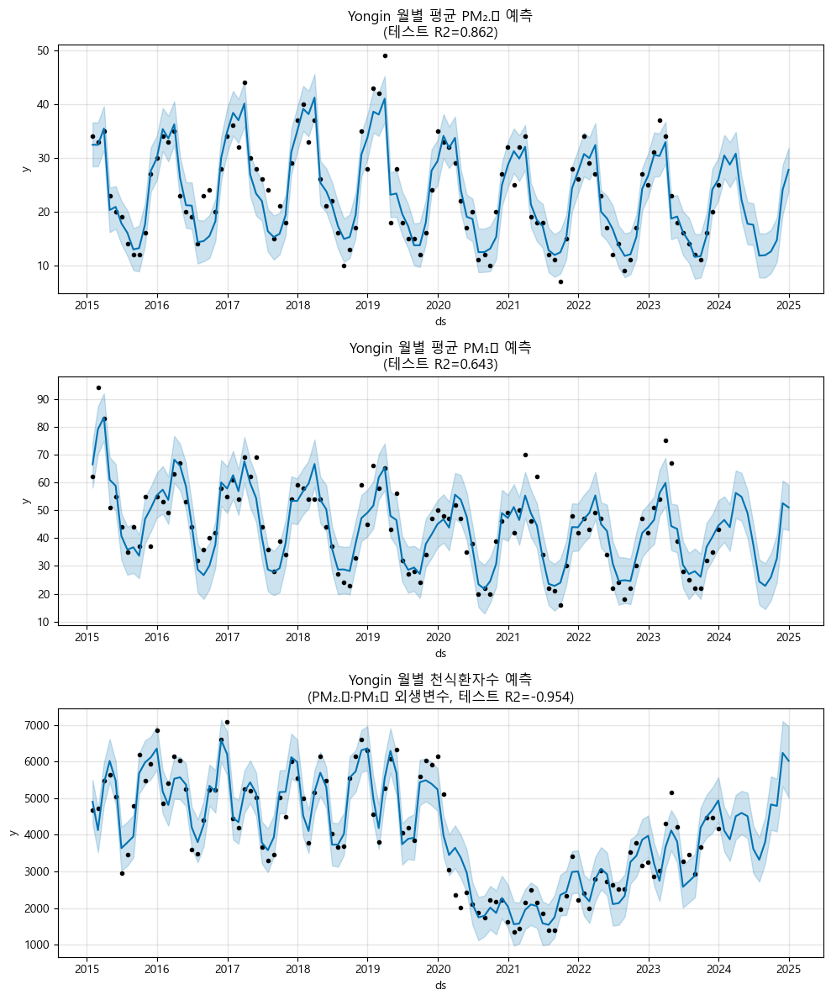

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_squared_error, r2_score

# 1. 데이터 불러오기 & 월별 집계
asthma = pd.read_excel('Asthma_top30_Sum_removed_outliers.xlsx',
                       index_col=0, parse_dates=True)
pm25   = pd.read_excel('pm25_top30_fixed.xlsx',
                       index_col=0, parse_dates=True)
pm10   = pd.read_excel('pm10_top30_fixed.xlsx',
                       index_col=0, parse_dates=True)

# 2. 공통 인덱스로 동기화 & 월별 집계
idx    = pm25.index.intersection(asthma.index).intersection(pm10.index)
pm25_m = pm25.loc[idx].resample('M').mean().reset_index()
pm10_m = pm10.loc[idx].resample('M').mean().reset_index()
as_m   = asthma.loc[idx].resample('M').sum().reset_index()

# 3. Prophet용 포맷 변환 함수
def make_prophet_df(df_month, city):
    tmp = df_month.iloc[:, [0, df_month.columns.get_loc(city)]].copy()
    tmp.columns = ['ds','y']
    return tmp

# 4. 예측 옵션
CP_SCALE = 0.5
SEAS_MODE = 'multiplicative'

# 5. 도시간 루프
cities = sorted(set(pm25.columns) & set(pm10.columns) & set(asthma.columns))
for city in cities:
    print(f'\n=== {city} 예측 및 평가 ===')
    # 5.1. Prophet 데이터 준비
    df25  = make_prophet_df(pm25_m, city)
    df10  = make_prophet_df(pm10_m, city)
    df_as = make_prophet_df(as_m,   city)

    # 5.2. PM2.5 모델 학습 + 예측
    m25 = Prophet(yearly_seasonality=True,
                  changepoint_prior_scale=CP_SCALE,
                  seasonality_mode=SEAS_MODE)
    m25.fit(df25)
    fut25 = m25.make_future_dataframe(periods=12, freq='M')
    fc25  = m25.predict(fut25)

    # 5.3. PM10 모델 학습 + 예측
    m10 = Prophet(yearly_seasonality=True,
                  changepoint_prior_scale=CP_SCALE,
                  seasonality_mode=SEAS_MODE)
    m10.fit(df10)
    fut10 = m10.make_future_dataframe(periods=12, freq='M')
    fc10  = m10.predict(fut10)

    # 5.4. 천식환자 모델 (PM2.5, PM10 외생변수)
    df_as2 = (
        df_as
        .merge(fc25[['ds','yhat']].rename(columns={'yhat':'pm25'}), on='ds')
        .merge(fc10[['ds','yhat']].rename(columns={'yhat':'pm10'}), on='ds')
    )
    m_as = Prophet(yearly_seasonality=True,
                   changepoint_prior_scale=CP_SCALE,
                   seasonality_mode=SEAS_MODE)
    m_as.add_regressor('pm25')
    m_as.add_regressor('pm10')
    m_as.fit(df_as2.dropna(subset=['pm25','pm10']))

    fut_as = pd.DataFrame({
        'ds'  : fc25['ds'],
        'pm25': fc25['yhat'],
        'pm10': fc10['yhat'],
        'y'   : None
    })
    fc_as = m_as.predict(fut_as)

    # 6. 정확도 평가 (마지막 12개월)
    actual25 = df25['y'].iloc[-12:].values
    pred25   = fc25['yhat'].iloc[-12:].values
    mse25    = mean_squared_error(actual25, pred25)
    rmse25   = np.sqrt(mse25)
    r2_25    = r2_score(actual25, pred25)

    actual10 = df10['y'].iloc[-12:].values
    pred10   = fc10['yhat'].iloc[-12:].values
    mse10    = mean_squared_error(actual10, pred10)
    rmse10   = np.sqrt(mse10)
    r2_10    = r2_score(actual10, pred10)

    actual_as = df_as['y'].iloc[-12:].values
    pred_as   = fc_as['yhat'].iloc[-12:].values
    mse_as    = mean_squared_error(actual_as, pred_as)
    rmse_as   = np.sqrt(mse_as)
    r2_as     = r2_score(actual_as, pred_as)

    print(f"PM2.5   ▶ MSE: {mse25:.3f}, RMSE: {rmse25:.3f}, R2: {r2_25:.3f}")
    print(f"PM10    ▶ MSE: {mse10:.3f}, RMSE: {rmse10:.3f}, R2: {r2_10:.3f}")
    print(f"Asthma ▶ MSE: {mse_as:.3f}, RMSE: {rmse_as:.3f}, R2: {r2_as:.3f}")

    # 7. 도시별 3행 플롯
    fig, axes = plt.subplots(3, 1, figsize=(10, 12))
    # (1) PM2.5
    m25.plot(fc25, ax=axes[0])
    axes[0].set_title(f'{city} 월별 평균 PM₂.₅ 예측\n(테스트 R2={r2_25:.3f})')
    # (2) PM10
    m10.plot(fc10, ax=axes[1])
    axes[1].set_title(f'{city} 월별 평균 PM₁₀ 예측\n(테스트 R2={r2_10:.3f})')
    # (3) 천식환자
    m_as.plot(fc_as, ax=axes[2])
    axes[2].set_title(
        f'{city} 월별 천식환자수 예측\n(PM₂.₅·PM₁₀ 외생변수, 테스트 R2={r2_as:.3f})'
    )

    fig.subplots_adjust(hspace=0.3)
    plt.tight_layout()
    plt.show()


C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:23: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm25_m   = pm25.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  pm10_m   = pm10.loc[idx].resample('M').mean().reset_index()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  asthma_m = asthma.loc[idx].resample('M').sum().reset_index()
16:43:06 - cmdstanpy - INFO - Chain [1] start processing
16:43:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.


---- Processing Seoul ----


16:43:06 - cmdstanpy - INFO - Chain [1] start processing
16:43:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:06 - cmdstanpy - INFO - Chain [1] start processing
16:43:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


16:43:11 - cmdstanpy - INFO - Chain [1] start processing
16:43:11 - cmdstanpy - INFO - Chain [1] done processing


Asthma Hybrid ▶ MSE:54447653.8, RMSE:7378.9, R2:-1.322

---- Processing Busan ----


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:11 - cmdstanpy - INFO - Chain [1] start processing
16:43:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:11 - cmdstanpy - INFO - Chain [1] start processing
16:43:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


16:43:16 - cmdstanpy - INFO - Chain [1] start processing
16:43:16 - cmdstanpy - INFO - Chain [1] done processing


Asthma Hybrid ▶ MSE:6220461.2, RMSE:2494.1, R2:-1.438

---- Processing Daegu ----


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:16 - cmdstanpy - INFO - Chain [1] start processing
16:43:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:16 - cmdstanpy - INFO - Chain [1] start processing
16:43:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


16:43:21 - cmdstanpy - INFO - Chain [1] start processing
16:43:21 - cmdstanpy - INFO - Chain [1] done processing


Asthma Hybrid ▶ MSE:4145705.3, RMSE:2036.1, R2:-0.744

---- Processing Pyeongtaek ----


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:22 - cmdstanpy - INFO - Chain [1] start processing
16:43:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:22 - cmdstanpy - INFO - Chain [1] start processing
16:43:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


16:43:26 - cmdstanpy - INFO - Chain [1] start processing
16:43:27 - cmdstanpy - INFO - Chain [1] done processing


Asthma Hybrid ▶ MSE:590500.3, RMSE:768.4, R2:-0.808

---- Processing Seongnam ----


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


16:43:32 - cmdstanpy - INFO - Chain [1] start processing
16:43:32 - cmdstanpy - INFO - Chain [1] done processing


Asthma Hybrid ▶ MSE:427338.0, RMSE:653.7, R2:-0.615

---- Processing Gwangmyeong ----


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:32 - cmdstanpy - INFO - Chain [1] start processing
16:43:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:32 - cmdstanpy - INFO - Chain [1] start processing
16:43:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


16:43:37 - cmdstanpy - INFO - Chain [1] start processing
16:43:37 - cmdstanpy - INFO - Chain [1] done processing


Asthma Hybrid ▶ MSE:9440.4, RMSE:97.2, R2:-0.113

---- Processing Siheung ----


C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:37 - cmdstanpy - INFO - Chain [1] start processing
16:43:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
16:43:37 - cmdstanpy - INFO - Chain [1] start processing
16:43:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\dgdl1\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
Asthma Hybrid ▶ MSE:111894.2, RMSE:334.5, R2:-0.764


C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


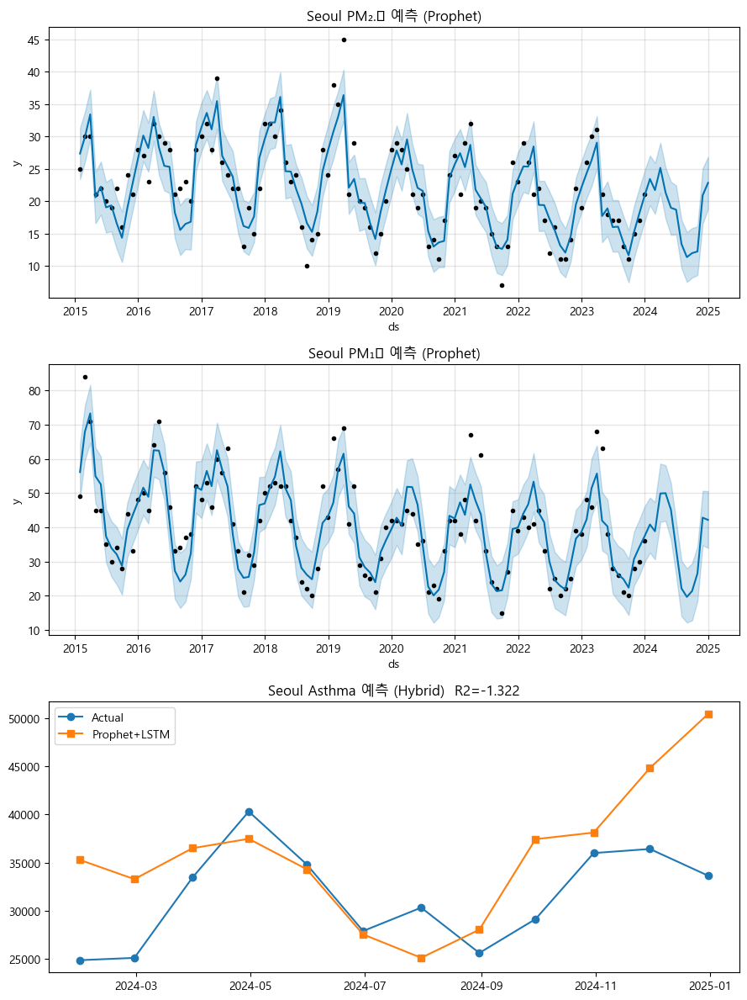

C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


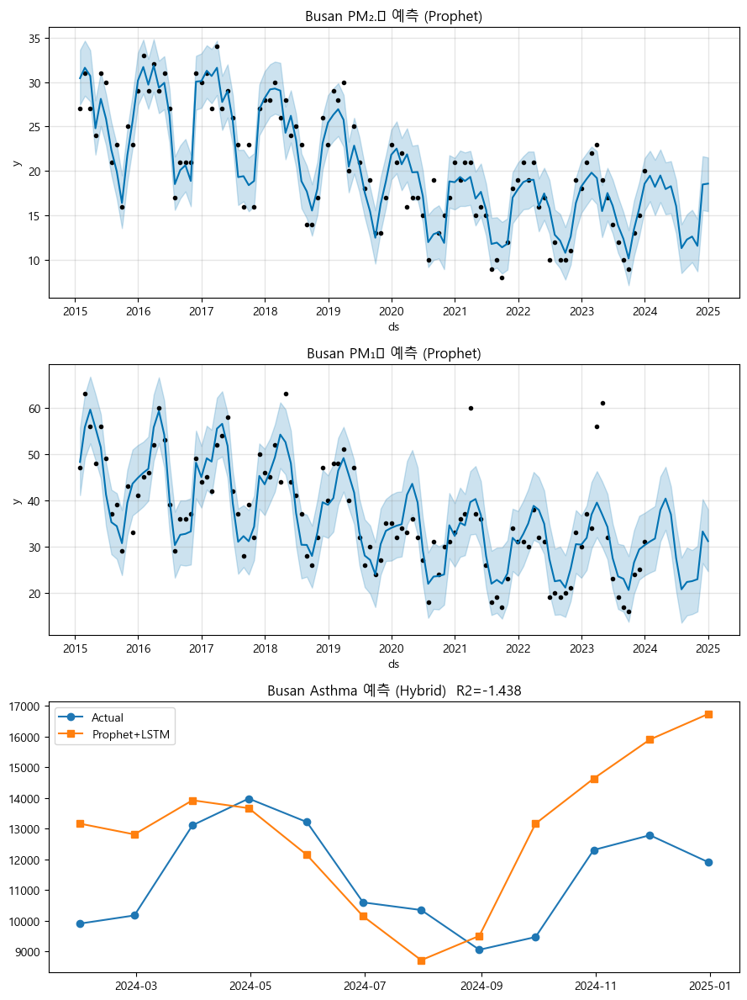

C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


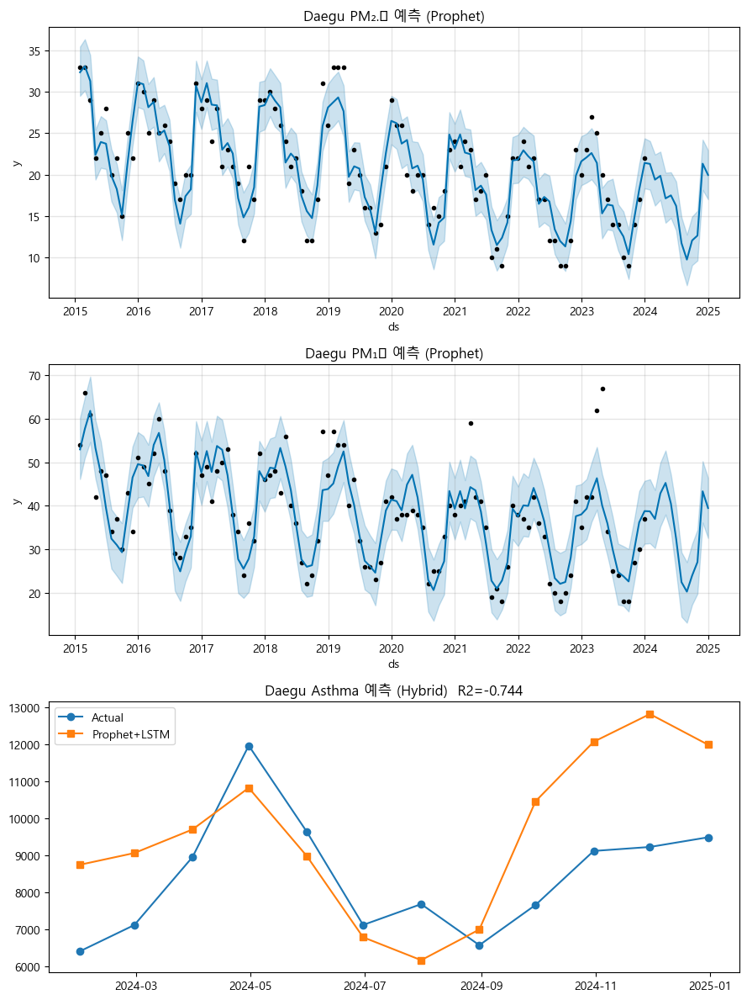

C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


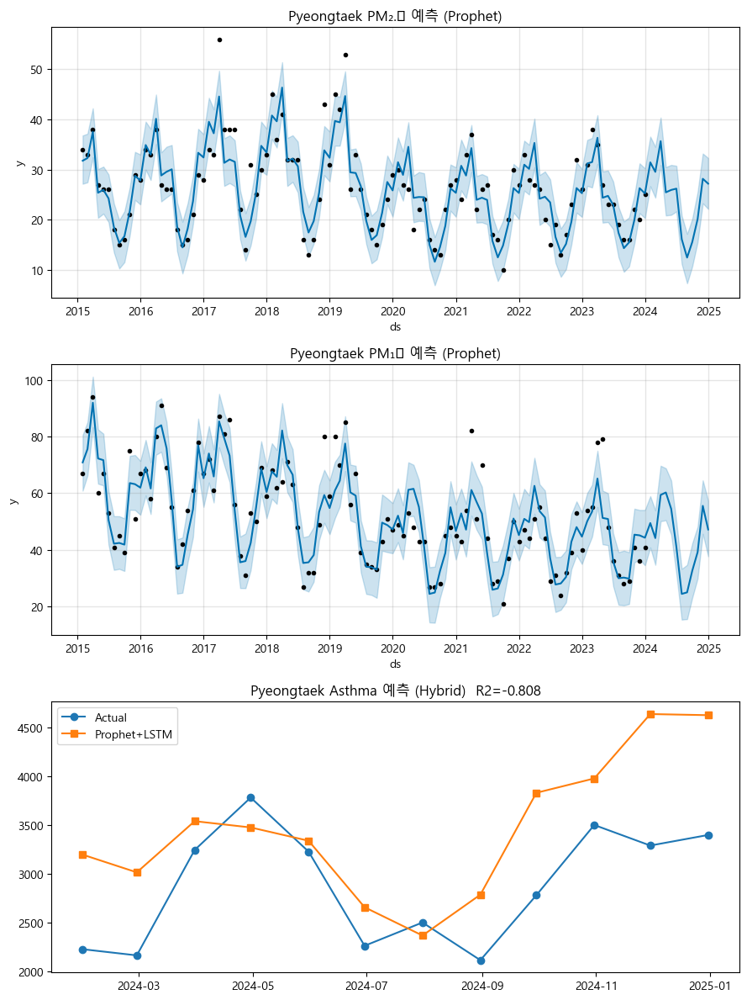

C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


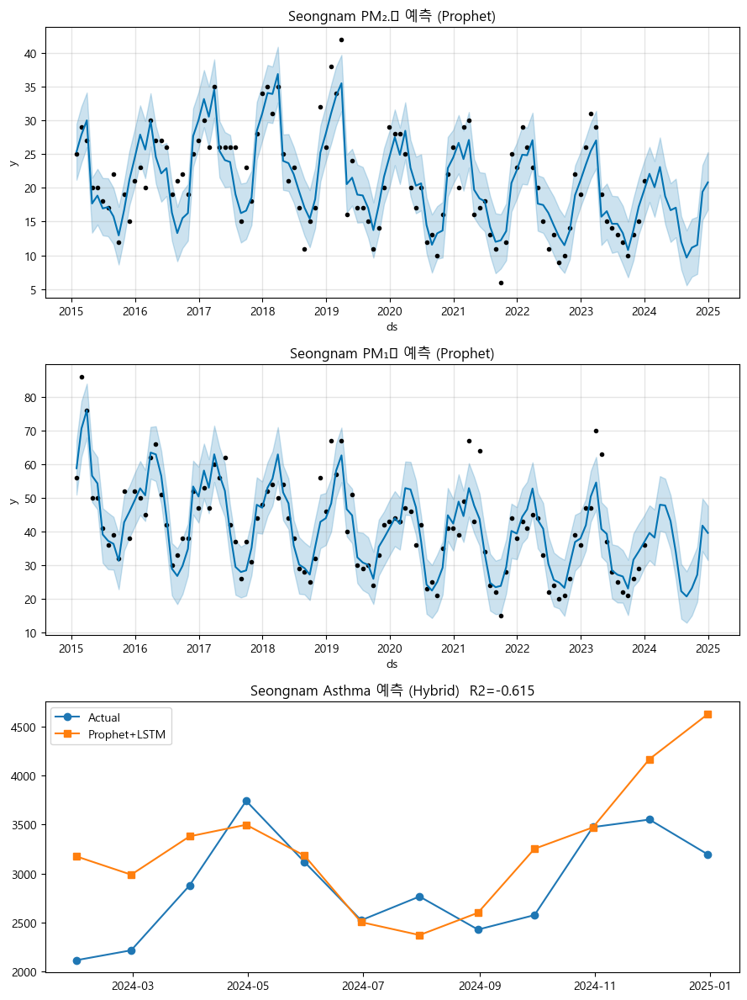

C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


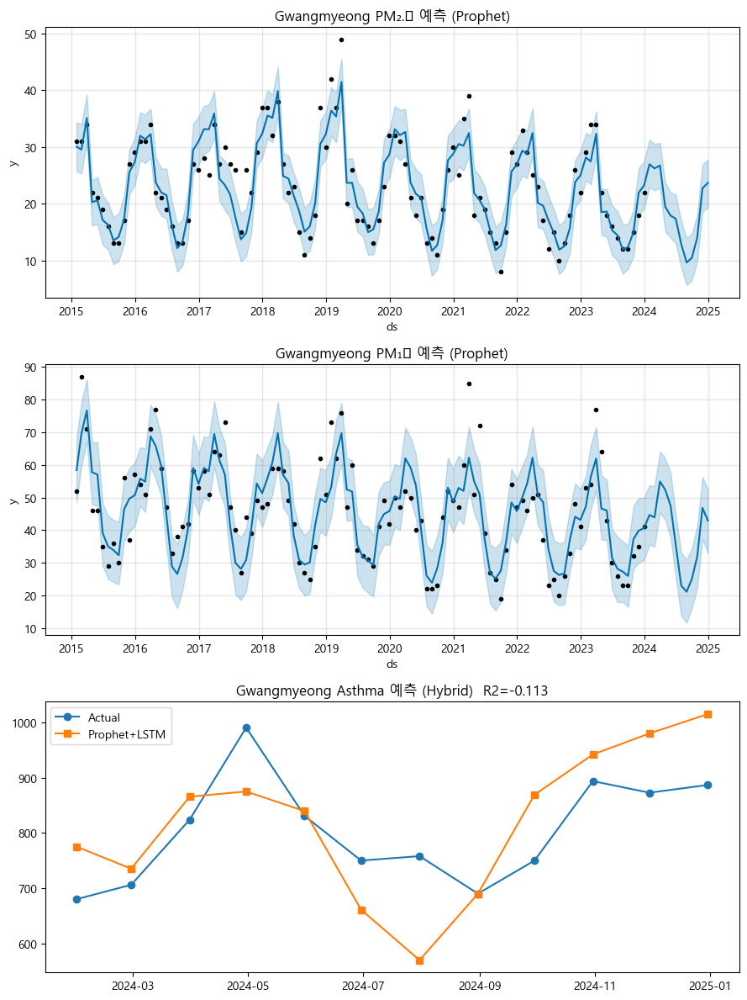

C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
C:\Users\dgdl1\AppData\Local\Temp\ipykernel_25560\994285810.py:166: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  plt.tight_layout()
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8325 (\N{SUBSCRIPT FIVE}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)
f:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8320 (\N{SUBSCRIPT ZERO}) missing from font(s) Malgun Gothic.
  fig.canvas.print_figure(bytes_io, **kw)


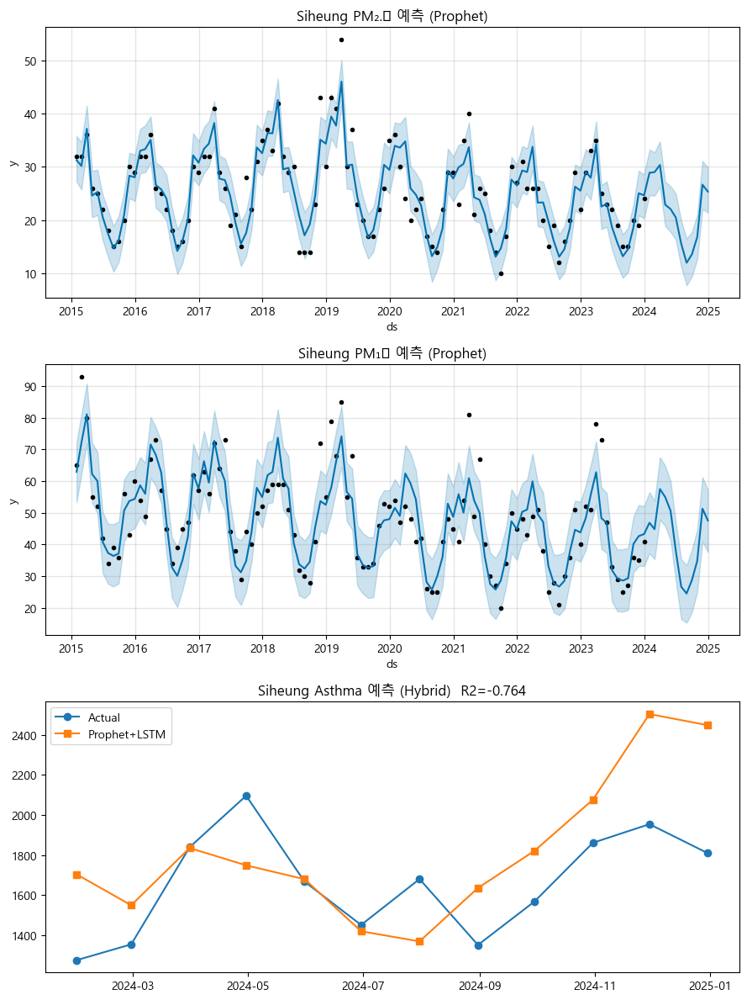

In [15]:
# 프로펫 + LSTM 혼합 사용

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras import backend as K

# 1. 데이터 불러오기 & 월별 집계
asthma = pd.read_excel('Asthma_top30_Sum_removed_outliers.xlsx',
                       index_col=0, parse_dates=True)
pm25   = pd.read_excel('pm25_top30_fixed.xlsx',
                       index_col=0, parse_dates=True)
pm10   = pd.read_excel('pm10_top30_fixed.xlsx',
                       index_col=0, parse_dates=True)

# 2. 공통 인덱스 동기화 및 월별 집계
idx      = pm25.index.intersection(asthma.index).intersection(pm10.index)
pm25_m   = pm25.loc[idx].resample('M').mean().reset_index()
pm10_m   = pm10.loc[idx].resample('M').mean().reset_index()
asthma_m = asthma.loc[idx].resample('M').sum().reset_index()

# 3. Prophet용 포맷 변환 함수
def make_df(df_month, city):
    tmp = df_month.iloc[:, [0, df_month.columns.get_loc(city)]].copy()
    tmp.columns = ['ds','y']
    return tmp

# 4. 도시 리스트 지정
cities = ['Seoul','Busan','Daegu','Pyeongtaek', 'Seongnam', 'Gwangmyeong', 'Siheung']

# 5. Prophet 옵션
CP_SCALE  = 0.3
SEAS_MODE  = 'multiplicative'

# 6. 결과 저장용 딕셔너리
results = {}

for city in cities:
    print(f'\n---- Processing {city} ----')
    # Prophet 입력 데이터 준비
    df25 = make_df(pm25_m,   city)
    df10 = make_df(pm10_m,   city)
    df_as = make_df(asthma_m, city)

    # 6.1 PM2.5 Prophet 모델
    m25 = Prophet(yearly_seasonality=True,
                  changepoint_prior_scale=CP_SCALE,
                  seasonality_mode=SEAS_MODE)
    m25.fit(df25)
    fut25 = m25.make_future_dataframe(periods=12, freq='M')
    fc25  = m25.predict(fut25)

    # 6.2 PM10 Prophet 모델
    m10 = Prophet(yearly_seasonality=True,
                  changepoint_prior_scale=CP_SCALE,
                  seasonality_mode=SEAS_MODE)
    m10.fit(df10)
    fut10 = m10.make_future_dataframe(periods=12, freq='M')
    fc10  = m10.predict(fut10)

    # 6.3 천식환자 Prophet 학습 및 잔차 계산
    df_as2 = (
        df_as
         .merge(fc25[['ds','yhat']].rename(columns={'yhat':'pm25'}), on='ds')
         .merge(fc10[['ds','yhat']].rename(columns={'yhat':'pm10'}), on='ds')
    )
    m_as = Prophet(yearly_seasonality=True,
                   changepoint_prior_scale=CP_SCALE,
                   seasonality_mode=SEAS_MODE)
    m_as.add_regressor('pm25')
    m_as.add_regressor('pm10')
    m_as.fit(df_as2.dropna(subset=['pm25','pm10']))

    # Prophet-only 예측
    fut_as = pd.DataFrame({
        'ds'  : fc25['ds'],
        'pm25': fc25['yhat'],
        'pm10': fc10['yhat'],
        'y'   : None
    })
    fc_as_prophet = m_as.predict(fut_as)

    # 잔차(residual) = 실제(df_as) - Prophet 예측
    pred_train_as = m_as.predict(df_as2)['yhat']
    residual = df_as['y'] - pred_train_as
    residual = residual.dropna()

    # 6.4 LSTM 학습용 데이터 준비 (잔차 + 외생변수)
    df_lstm = pd.DataFrame({'residual': residual})
    df_lstm['pm25'] = df_as2.loc[residual.index, 'pm25']
    df_lstm['pm10'] = df_as2.loc[residual.index, 'pm10']

    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(df_lstm)

    # 시퀀스 생성
    def make_seq(data, n_steps=12):
        X, y = [], []
        for i in range(len(data)-n_steps):
            X.append(data[i:i+n_steps,1:])  # pm25, pm10
            y.append(data[i+n_steps,0])     # residual
        return np.array(X), np.array(y)

    n_steps = 12
    X, y = make_seq(scaled, n_steps)

    split = len(X)-12
    X_train, y_train = X[:split], y[:split]
    X_test,  y_test  = X[split:], y[split:]

    K.clear_session()
    lstm = Sequential([
        LSTM(32, input_shape=(n_steps,2)),
        Dense(16, activation='relu'),
        Dense(1)
    ])
    lstm.compile('adam','mse')
    lstm.fit(X_train, y_train, epochs=50, batch_size=8, verbose=0)

    # 6.5 LSTM으로 잔차 예측 후 최종 예측 생성
    res_pred = lstm.predict(X_test).ravel()
    inv = scaler.inverse_transform(
        np.hstack([res_pred.reshape(-1,1),
                   np.zeros((len(res_pred),2))])
    )[:,0]
    final_as = fc_as_prophet['yhat'].iloc[-12:].values + inv

    # 6.6 실제값
    actual_as = df_as['y'].iloc[-12:].values

    # 6.7 성능 평가
    mse_as  = mean_squared_error(actual_as, final_as)
    rmse_as = np.sqrt(mse_as)
    r2_as   = r2_score(actual_as, final_as)
    print(f'Asthma Hybrid ▶ MSE:{mse_as:.1f}, RMSE:{rmse_as:.1f}, R2:{r2_as:.3f}')

    # 저장
    results[city] = {
        'm25': m25, 'fc25': fc25,
        'm10': m10, 'fc10': fc10,
        'm_as': m_as, 'fc_as': fc_as_prophet,
        'final_as': final_as, 'actual_as': actual_as
    }

# 7. 시각화 (도시별 3행 플롯)
for city, res in results.items():
    fig, axes = plt.subplots(3,1,figsize=(9,12))
    # PM2.5
    res['m25'].plot(res['fc25'], ax=axes[0])
    axes[0].set_title(f'{city} PM₂.₅ 예측 (Prophet)')
    # PM10
    res['m10'].plot(res['fc10'], ax=axes[1])
    axes[1].set_title(f'{city} PM₁₀ 예측 (Prophet)')
    # Asthma Hybrid
    ds = res['fc_as']['ds'].iloc[-12:]
    axes[2].plot(ds, res['actual_as'], 'o-', label='Actual')
    axes[2].plot(ds, res['final_as'] , 's-', label='Prophet+LSTM')
    axes[2].set_title(f'{city} Asthma 예측 (Hybrid)  R2={r2_score(res["actual_as"],res["final_as"]):.3f}')
    axes[2].legend()
    fig.subplots_adjust(hspace=0.3)
    plt.tight_layout()
    plt.show()
